# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 25.09.2022

Мягкий дедлайн: 23:59MSK 10.10.2022

Жесткий дедлайн: 23:59MSK 18.10.2022

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [2]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)

m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline


%matplotlib inline

sns.set(style="darkgrid")

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ


In [5]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!kaggle competitions download -c nyc-taxi-trip-duration
!unzip nyc-taxi-trip-duration.zip
!rm nyc-taxi-trip-duration.zip

100% 85.8M/85.8M [00:03<00:00, 31.8MB/s]
100% 85.8M/85.8M [00:03<00:00, 24.4MB/s]
Archive:  nyc-taxi-trip-duration.zip
  inflating: sample_submission.zip   
  inflating: test.zip                
  inflating: train.zip               


In [6]:
!unzip train.zip 
!unzip test.zip
!unzip sample_submission.zip
!rm train.zip test.zip sample_submission.zip

Archive:  train.zip
  inflating: train.csv               
Archive:  test.zip
  inflating: test.csv                
Archive:  sample_submission.zip
  inflating: sample_submission.csv   


In [7]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [8]:
train_df.head(7)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435
5,id0801584,2,2016-01-30 22:01:40,2016-01-30 22:09:03,6,-73.982857,40.742195,-73.992081,40.749184,N,443
6,id1813257,1,2016-06-17 22:34:59,2016-06-17 22:40:40,4,-73.969017,40.757839,-73.957405,40.765896,N,341


Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [9]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
train_df = train_df.drop('dropoff_datetime', axis=1)
train_df.head(5)

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [10]:
from datetime import datetime

train_df['pickup_datetime'] = pd.to_datetime(train_df['pickup_datetime'])
train_df.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [11]:
train_df.dtypes

id                            object
vendor_id                      int64
pickup_datetime       datetime64[ns]
passenger_count                int64
pickup_longitude             float64
pickup_latitude              float64
dropoff_longitude            float64
dropoff_latitude             float64
store_and_fwd_flag            object
trip_duration                  int64
dtype: object

В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

<Axes: title={'center': 'Распределение длительности поездки на такси (сек)'}, xlabel='Trip duration', ylabel='Число записей'>

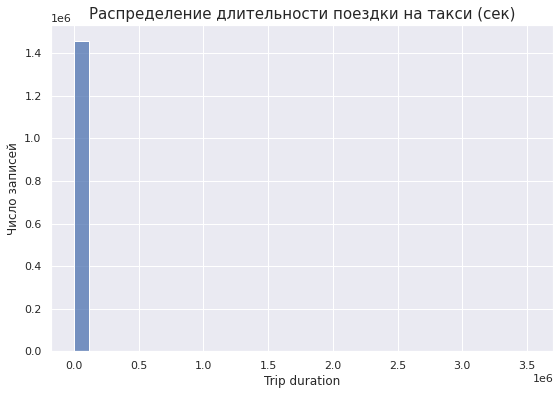

In [12]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение длительности поездки на такси (сек)', fontsize=15)
plt.xlabel('Trip duration')
plt.ylabel('Число записей')
sns.histplot(train_df['trip_duration'], bins=30)

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

<Axes: title={'center': 'Распределение лог. длительности поездки на такси (сек)'}, xlabel='Log Trip duration', ylabel='Число записей'>

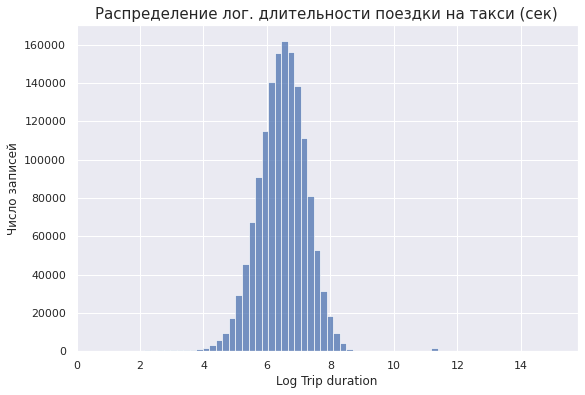

In [13]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение лог. длительности поездки на такси (сек)', fontsize=15)
plt.xlabel('Log Trip duration')
plt.ylabel('Число записей')
sns.histplot(np.log1p(train_df['trip_duration']), bins=70, ax=ax)

In [14]:
train_df['log_trip_duration'] = np.log1p(train_df['trip_duration'].values)
train_df['log_trip_duration']

0          6.122493
1          6.498282
2          7.661527
3          6.063785
4          6.077642
             ...   
1458639    6.658011
1458640    6.486161
1458641    6.639876
1458642    5.924256
1458643    5.293305
Name: log_trip_duration, Length: 1458644, dtype: float64

In [15]:
train_df

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,log_trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455,6.122493
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663,6.498282
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,7.661527
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429,6.063785
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435,6.077642
...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,4,-73.982201,40.745522,-73.994911,40.740170,N,778,6.658011
1458640,id1049543,1,2016-01-10 07:35:15,1,-74.000946,40.747379,-73.970184,40.796547,N,655,6.486161
1458641,id2304944,2,2016-04-22 06:57:41,1,-73.959129,40.768799,-74.004433,40.707371,N,764,6.639876
1458642,id2714485,1,2016-01-05 15:56:26,1,-73.982079,40.749062,-73.974632,40.757107,N,373,5.924256


Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [16]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
best_predict = np.mean(train_df['log_trip_duration'])
print(f"Лучшее значение: {best_predict} или {np.exp(best_predict)} сек.")

Лучшее значение: 6.466978409297406 или 643.5362830079474 сек.


## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

In [17]:
dates = train_df['pickup_datetime'].dt.date.sort_values()


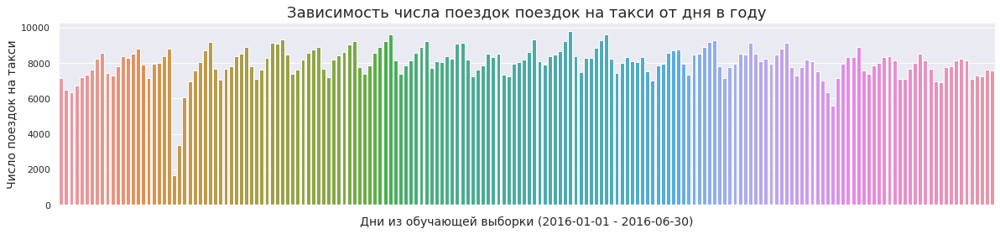

In [18]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
plt.figure(figsize=(20, 4))
dates_plot = sns.countplot(
  x=dates
)

plt.title('Зависимость числа поездок поездок на такси от дня в году', fontsize=18)
plt.ylabel('Число поездок на такси', fontsize=14)
plt.xlabel('Дни из обучающей выборки (2016-01-01 - 2016-06-30)', fontsize=14)
dates_plot.set_xticklabels('');


**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

In [19]:
train_df.groupby(dates).count()['id'].sort_values().head()

pickup_datetime
2016-01-23    1648
2016-01-24    3383
2016-05-30    5570
2016-01-25    6084
2016-01-03    6353
Name: id, dtype: int64

In [20]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
number_of_trips_by_day = train_df.groupby(dates).count()['id']
number_of_trips_by_day.head(5)


pickup_datetime
2016-01-01    7162
2016-01-02    6512
2016-01-03    6353
2016-01-04    6725
2016-01-05    7204
Name: id, dtype: int64

In [21]:
df_daily_trips = pd.DataFrame(number_of_trips_by_day.values)
df_daily_trips = df_daily_trips.rename(columns={0 : "number_of_trips"})

df_daily_trips['day_of_week'] = dates.unique()
df_daily_trips['day_of_week'] = pd.to_datetime(df_daily_trips['day_of_week'])
df_daily_trips['day_of_week'] = df_daily_trips['day_of_week'].dt.day_of_week

df_daily_trips['day_of_week'] += 1
df_daily_trips['day_of_week'].describe()


count    182.000000
mean       4.000000
std        2.005517
min        1.000000
25%        2.000000
50%        4.000000
75%        6.000000
max        7.000000
Name: day_of_week, dtype: float64

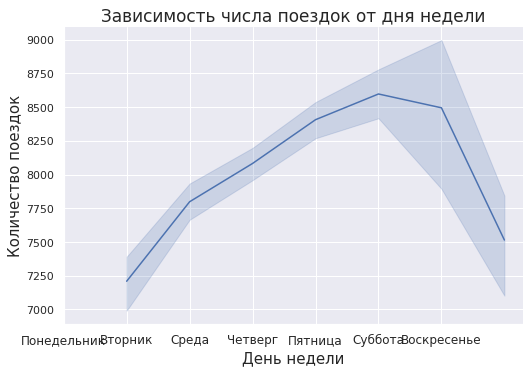

In [22]:
days_plot = sns.relplot(x='day_of_week',
           y='number_of_trips',
           kind='line',
            height=5,
            aspect=1.5,
           data=df_daily_trips)

plt.title('Зависимость числа поездок от дня недели', fontsize=17)
plt.xlabel('День недели', fontsize=15)
plt.ylabel('Количество поездок', fontsize=15)
plt.xticks(np.arange(7), labels=['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], fontsize=12);

In [23]:
hours = train_df['pickup_datetime'].dt.hour.rename('hours')
hours

0          17
1           0
2          11
3          19
4          13
           ..
1458639    13
1458640     7
1458641     6
1458642    15
1458643    14
Name: hours, Length: 1458644, dtype: int64

In [24]:
df_trips_by_hours = train_df.groupby([dates, hours]).count()['id'].to_frame()
df_trips_by_hours = df_trips_by_hours.rename(columns = {'id' : 'number_of_trips'})

df_trips_by_hours

number_of_trips
pickup_datetime hours                 
2016-01-01      0                  546
                1                  566
                2                  503
                3                  479
                4                  323
...                                ...
2016-06-30      19                 484
                20                 440
                21                 484
                22                 462
                23                 423

[4359 rows x 1 columns]

Text(5.334999999999994, 0.5, 'Количество поездок')

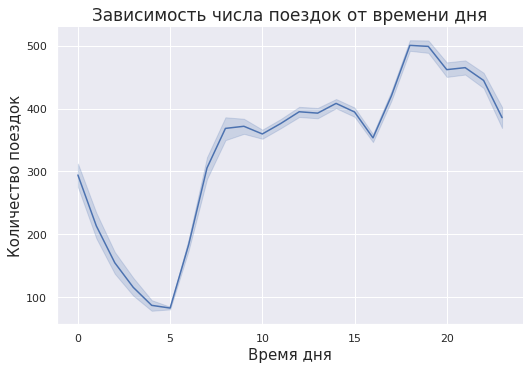

In [25]:
hours_plot = sns.relplot(x='hours',
            y='number_of_trips',
            kind='line',
            height=5,
            aspect=1.5,
            data=df_trips_by_hours)

plt.title('Зависимость числа поездок от времени дня', fontsize=17)
plt.xlabel('Время дня', fontsize=15)
plt.ylabel('Количество поездок', fontsize=15)

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

In [26]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
plot_data = train_df.copy()

plot_data['month_number'] = plot_data['pickup_datetime'].dt.month
plot_data['day_of_week'] = plot_data['pickup_datetime'].dt.day_of_week
plot_data['hour_number'] = plot_data['pickup_datetime'].dt.hour

plot_data = plot_data.drop(['vendor_id', 'passenger_count', 
                            'pickup_longitude', 'pickup_latitude',
                            'dropoff_longitude', 'dropoff_latitude', 
                            'store_and_fwd_flag', 'log_trip_duration'], 
                            axis='columns')

In [27]:
plot_data.head()

,id,pickup_datetime,trip_duration,month_number,day_of_week,hour_number
0,id2875421,2016-03-14 17:24:55,455,3,0,17
1,id2377394,2016-06-12 00:43:35,663,6,6,0
2,id3858529,2016-01-19 11:35:24,2124,1,1,11
3,id3504673,2016-04-06 19:32:31,429,4,2,19
4,id2181028,2016-03-26 13:30:55,435,3,5,13


In [28]:

df_month_hours = plot_data.groupby(['month_number', 'hour_number']).count()['id'].to_frame()
df_month_hours = df_month_hours.rename(columns={'id' : 'number_of_trips'})
df_month_hours['number_of_trips'] = df_month_hours['number_of_trips'] / (182 / 6)
df_month_hours

number_of_trips
month_number hour_number                 
1            0                 274.615385
             1                 210.989011
             2                 159.230769
             3                 117.824176
             4                  86.109890
...                                   ...
6            19                467.703297
             20                421.945055
             21                452.967033
             22                441.461538
             23                392.274725

[144 rows x 1 columns]

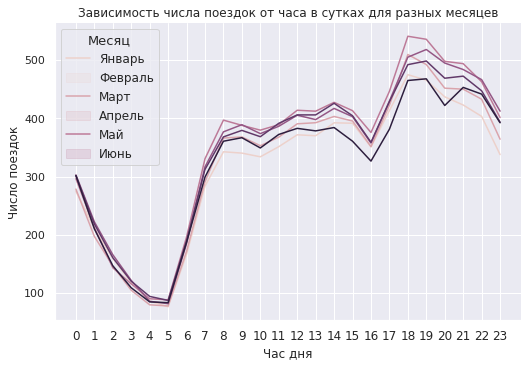

In [29]:
sns.relplot(x='hour_number',
            y='number_of_trips',
            hue='month_number',
            kind='line',
            height=5,
            aspect=1.5,
            legend=False,
            data=df_month_hours)

plt.title('Зависимость числа поездок от часа в сутках для разных месяцев')
plt.ylabel('Число поездок')
plt.xlabel('Час дня')
plt.xticks(np.arange(24), fontsize=12)
plt.legend(title='Месяц', labels=['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь'], title_fontsize=13, fontsize=12)

In [30]:
df_days_hours = plot_data.groupby(['day_of_week', 'hour_number']).count()['id'].to_frame()
df_days_hours = df_days_hours.rename(columns={'id' : 'number_of_trips'})
df_days_hours = df_days_hours / (182 / 7)

df_days_hours

number_of_trips
day_of_week hour_number                 
0           0                 165.346154
            1                  99.153846
            2                  63.769231
            3                  47.153846
            4                  51.961538
...                                  ...
6           19                386.384615
            20                351.384615
            21                336.038462
            22                303.538462
            23                244.884615

[168 rows x 1 columns]

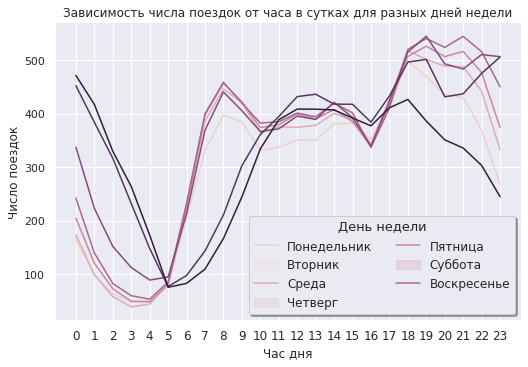

In [31]:
sns.relplot(x='hour_number',
            y='number_of_trips',
            hue='day_of_week',
            kind='line',
            height=5,
            aspect=1.5,
            legend=False,
            data=df_days_hours)

plt.title('Зависимость числа поездок от часа в сутках для разных дней недели')
plt.ylabel('Число поездок')
plt.xlabel('Час дня')
plt.xticks(np.arange(24), fontsize=12)
plt.legend(title='День недели', labels=['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], title_fontsize=13, fontsize=12, 
            ncol=2, loc='best', shadow=True);

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3. По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [32]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.model_selection import train_test_split

X_train, X_test = train_test_split(train_df, train_size=0.7, test_size=0.3, random_state=14)

In [33]:
plot_df = X_train.copy()

dates_train = plot_df['pickup_datetime'].dt.date.sort_values().rename('dates_train')

log_trip_duration_by_day = plot_df.groupby(dates_train).mean()['log_trip_duration']

df_log_trip_duration_daily = pd.DataFrame(log_trip_duration_by_day.values)
df_log_trip_duration_daily = df_log_trip_duration_daily.rename(columns={0 : 'log_trip_duration'})

df_log_trip_duration_daily['day_of_week'] = dates_train.unique()
df_log_trip_duration_daily['day_of_week'] = pd.to_datetime(df_log_trip_duration_daily['day_of_week'])
df_log_trip_duration_daily['day_of_week'] = df_log_trip_duration_daily['day_of_week'].dt.day_of_week

df_log_trip_duration_daily

,log_trip_duration,day_of_week
0,6.350590,4
1,6.314743,5
2,6.308354,6
3,6.310266,0
4,6.352303,1
...,...,...
177,6.457152,6
178,6.462786,0
179,6.502812,1
180,6.535533,2


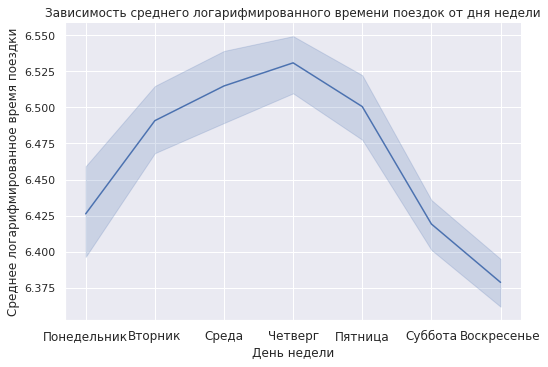

In [34]:
sns.relplot(x='day_of_week',
            y='log_trip_duration',
            kind='line',
            height=5,
            aspect=1.5,
            legend=False,
            data=df_log_trip_duration_daily)

plt.title('Зависимость среднего логарифмированного времени поездок от дня недели')
plt.ylabel('Среднее логарифмированное время поездки')
plt.xlabel('День недели')
plt.xticks(np.arange(7), fontsize=12)
plt.xticks(np.arange(7), labels=['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], fontsize=12);


In [35]:
hours_train = plot_df['pickup_datetime'].dt.hour.rename('hours_train')
log_trip_by_hours = plot_df.groupby([dates_train, hours_train]).mean()['log_trip_duration'].to_frame()

log_trip_by_hours

log_trip_duration
dates_train hours_train                   
2016-01-01  0                     6.516319
            1                     6.526005
            2                     6.503586
            3                     6.452662
            4                     6.478094
...                                    ...
2016-06-30  19                    6.493343
            20                    6.443661
            21                    6.472390
            22                    6.600064
            23                    6.570424

[4358 rows x 1 columns]

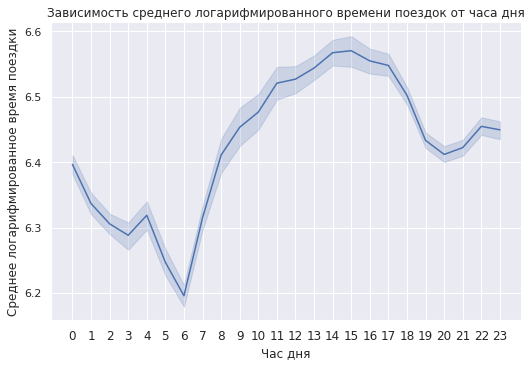

In [36]:
sns.relplot(x='hours_train',
            y='log_trip_duration',
            kind='line',
            height=5,
            aspect=1.5,
            legend=False,
            data=log_trip_by_hours)

plt.title('Зависимость среднего логарифмированного времени поездок от часа дня')
plt.ylabel('Среднее логарифмированное время поездки')
plt.xlabel('Час дня')
h = plt.xticks(np.arange(24), fontsize=12)


In [37]:
df_log_trip_duration_by_day = plot_df.groupby(dates_train).mean()['log_trip_duration'].to_frame() 
df_log_trip_duration_by_day

,log_trip_duration
dates_train,
2016-01-01,6.350590
2016-01-02,6.314743
2016-01-03,6.308354
2016-01-04,6.310266
2016-01-05,6.352303
...,...
2016-06-26,6.457152
2016-06-27,6.462786
2016-06-28,6.502812


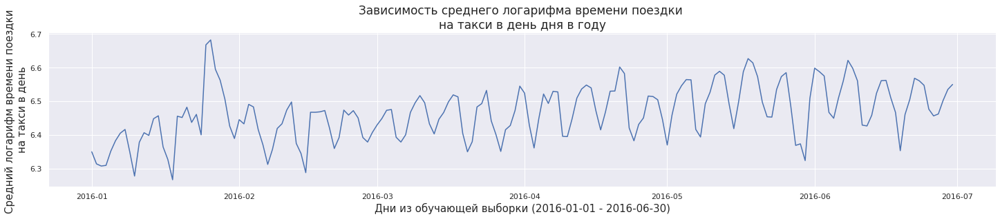

In [38]:
g = sns.relplot(x='dates_train',
            y='log_trip_duration',
            kind='line',
            height=4,
            aspect=5,
            data=df_log_trip_duration_by_day)

plt.title('Зависимость среднего логарифма времени поездки \nна такси в день дня в году', fontsize=17)

plt.xlabel('Дни из обучающей выборки (2016-01-01 - 2016-06-30)', fontsize=15)
plt.ylabel('Cредний логарифм времени поездки \nна такси в день', fontsize=15);


In [39]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
df_log_trip_duration_by_day.sort_values('log_trip_duration').head(10)

,log_trip_duration
dates_train,
2016-01-18,6.267641
2016-01-10,6.278584
2016-02-15,6.288694
2016-01-03,6.308354
2016-01-04,6.310266
2016-02-07,6.313161
2016-01-02,6.314743
2016-05-30,6.324534
2016-01-17,6.327685


In [40]:
df_log_trip_duration_by_day.sort_values('log_trip_duration').tail()


,log_trip_duration
dates_train,
2016-05-19,6.614617
2016-06-08,6.621932
2016-05-18,6.627148
2016-01-25,6.667912
2016-01-26,6.682541


**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [41]:
anormal_days = {
    "jan": set([25, 26, 27]),
    "may": set([149, 150, 151])
}

In [42]:
train_df['day_of_week'] = train_df['pickup_datetime'].dt.day_of_week
train_df['month_number'] = train_df['pickup_datetime'].dt.month
train_df['hour_number'] = train_df['pickup_datetime'].dt.hour
train_df['day_of_year'] = train_df['pickup_datetime'].dt.day_of_year

train_df['anormal_jan'] = 0
train_df['anormal_may'] = 0

train_df.loc[train_df['day_of_year'].isin(anormal_days['jan']), 'anormal_jan'] += 1
train_df.loc[train_df['day_of_year'].isin(anormal_days['may']), 'anormal_may'] += 1

In [43]:
train_df.head(10)

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,log_trip_duration,day_of_week,month_number,hour_number,day_of_year,anormal_jan,anormal_may
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455,6.122493,0,3,17,74,0,0
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663,6.498282,6,6,0,164,0,0
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,7.661527,1,1,11,19,0,0
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429,6.063785,2,4,19,97,0,0
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435,6.077642,5,3,13,86,0,0
5,id0801584,2,2016-01-30 22:01:40,6,-73.982857,40.742195,-73.992081,40.749184,N,443,6.095825,5,1,22,30,0,0
6,id1813257,1,2016-06-17 22:34:59,4,-73.969017,40.757839,-73.957405,40.765896,N,341,5.834811,4,6,22,169,0,0
7,id1324603,2,2016-05-21 07:54:58,1,-73.969276,40.797779,-73.922470,40.760559,N,1551,7.347300,5,5,7,142,0,0
8,id1301050,1,2016-05-27 23:12:23,1,-73.999481,40.738400,-73.985786,40.732815,N,255,5.545177,4,5,23,148,0,0
9,id0012891,2,2016-03-10 21:45:01,1,-73.981049,40.744339,-73.973000,40.789989,N,1225,7.111512,3,3,21,70,0,0


Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков стоит рассматривать как категориальные, а какие - как численные? Почему?

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [44]:
X_train, X_test = train_test_split(train_df, train_size=0.7, test_size=0.3, random_state=13)

y_train = X_train['log_trip_duration']
y_test = X_test['log_trip_duration']

X_train = X_train.drop('log_trip_duration', axis='columns')
X_test = X_test.drop('log_trip_duration', axis='columns')

X_days_and_time_train = X_train[['anormal_jan', 'anormal_may', 'day_of_week', 'month_number', 'hour_number', 'day_of_year']]
X_days_and_time_test = X_test[['anormal_jan', 'anormal_may', 'day_of_week', 'month_number', 'hour_number', 'day_of_year']]

In [45]:
X_days_and_time_train


,anormal_jan,anormal_may,day_of_week,month_number,hour_number,day_of_year
502213,0,0,6,6,9,178
505504,0,0,6,6,23,178
381784,0,0,4,2,9,43
835757,0,0,2,3,18,76
1391835,0,0,3,4,19,105
...,...,...,...,...,...,...
1392611,0,0,4,4,23,99
1216442,0,0,2,5,21,132
256742,0,0,2,4,23,97
253456,0,0,0,3,10,74


In [46]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.preprocessing import OneHotEncoder, StandardScaler

ohe = OneHotEncoder(sparse=False)

X_days_and_time_train_trans_0 = ohe.fit_transform(X_days_and_time_train[['anormal_jan', 'anormal_may', 'day_of_week', 'month_number', 'hour_number']])
X_days_and_time_test_trans_0 = ohe.transform(X_days_and_time_test[['anormal_jan', 'anormal_may', 'day_of_week', 'month_number', 'hour_number']])

scaler = StandardScaler()

X_days_and_time_train_trans_1 = scaler.fit_transform(X_days_and_time_train[['day_of_year']])
X_days_and_time_test_trans_1 = scaler.fit_transform(X_days_and_time_test[['day_of_year']])


/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [47]:
X_days_and_time_train_trans = np.concatenate((X_days_and_time_train_trans_0, X_days_and_time_train_trans_1), axis=1)
X_days_and_time_test_trans = np.concatenate((X_days_and_time_test_trans_0, X_days_and_time_test_trans_1), axis=1)

X_days_and_time_train_trans.shape, X_days_and_time_test_trans.shape

((1021050, 42), (437594, 42))

In [48]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

model = Ridge(random_state=14)

model.fit(X_days_and_time_train_trans, y_train)

pred_test = model.predict(X_days_and_time_test_trans)
pred_train = model.predict(X_days_and_time_train_trans)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')


RMSLE на тесте: 0.7876, 
RMSLE на трейне: 0.7887


## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [49]:
def show_circles_on_map(data, latitude_column, longitude_column, color, radius=100):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=radius,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [50]:
show_circles_on_map(X_train.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [51]:
show_circles_on_map(X_train.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

**Вопрос**: Какие две точки выделяются на карте?

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [52]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
def haversine_dist(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h


In [53]:
train_df.loc[:, 'haversine'] = haversine_dist(train_df['pickup_latitude'].values, train_df['pickup_longitude'].values, \
    train_df['dropoff_latitude'].values, train_df['dropoff_longitude'].values)

X_train.loc[:, 'haversine'] = haversine_dist(X_train['pickup_latitude'].values, X_train['pickup_longitude'].values, \
    X_train['dropoff_latitude'].values, X_train['dropoff_longitude'].values)


In [54]:
X_train.head(7)

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,day_of_week,month_number,hour_number,day_of_year,anormal_jan,anormal_may,haversine
502213,id1615460,2,2016-06-26 09:27:45,2,-74.013710,40.645393,-73.989510,40.669369,N,646,6,6,9,178,0,0,3.357771
505504,id3415975,1,2016-06-26 23:48:52,1,-74.007042,40.704967,-73.978287,40.728909,N,795,6,6,23,178,0,0,3.600011
381784,id2966434,2,2016-02-12 09:23:18,1,-73.958771,40.777939,-73.980530,40.770168,N,556,4,2,9,43,0,0,2.025772
835757,id1640176,2,2016-03-16 18:20:37,1,-73.970787,40.761066,-73.960129,40.775440,N,413,2,3,18,76,0,0,1.833080
1391835,id2659223,1,2016-04-14 19:57:43,2,-73.987328,40.760590,-74.007675,40.740807,N,788,3,4,19,105,0,0,2.788696
626849,id0065727,1,2016-03-25 09:49:30,1,-73.990593,40.760742,-73.974358,40.753555,N,628,4,3,9,85,0,0,1.583864
1274458,id3224196,1,2016-03-05 02:40:31,1,-73.985649,40.717968,-74.000458,40.729992,N,767,5,3,2,65,0,0,1.828906


Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку:

In [55]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
train_df['log_haversine'] = np.log1p(train_df['haversine'])

In [56]:
train_df.sample(7)

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,log_trip_duration,day_of_week,month_number,hour_number,day_of_year,anormal_jan,anormal_may,haversine,log_haversine
53181,id2523088,2,2016-06-24 17:23:33,1,-73.863571,40.769890,-73.984062,40.759911,N,4427,8.395703,4,6,17,176,0,0,10.208063,2.416633
991486,id1037091,2,2016-06-14 06:49:30,3,-73.959465,40.771664,-73.953033,40.788773,N,355,5.874931,1,6,6,166,0,0,1.977999,1.091251
401099,id1891215,1,2016-03-12 11:19:09,1,-73.976311,40.748302,-73.977890,40.734093,N,567,6.342121,5,3,11,72,0,0,1.585644,0.949975
1203285,id3456065,2,2016-04-02 23:54:02,2,-74.009079,40.712173,-73.997536,40.736317,N,486,6.188264,5,4,23,93,0,0,2.855406,1.349476
882743,id0545587,2,2016-04-25 13:35:22,1,-73.955521,40.776775,-73.941490,40.793613,N,530,6.274762,0,4,13,116,0,0,2.213802,1.167455
710771,id0607011,2,2016-04-03 20:34:41,5,-73.959442,40.771812,-73.982880,40.775101,N,507,6.230481,6,4,20,94,0,0,2.007201,1.101010
1104906,id1624569,1,2016-03-03 19:54:17,2,-73.782135,40.644665,-73.992661,40.756687,N,2672,7.890957,3,3,19,63,0,0,21.682365,3.121588


Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

In [57]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
plot_data = train_df[['haversine', 'log_haversine', 'log_trip_duration']]


Text(0.5, 0.98, 'Зависимость лог. времени поездки от расстояния')

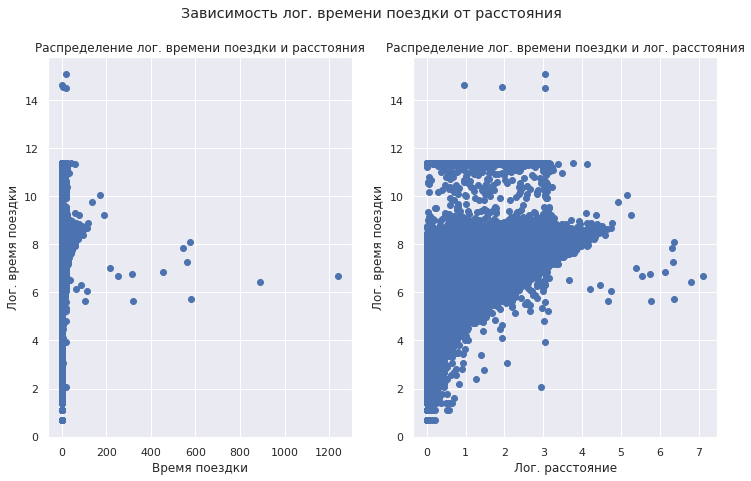

In [58]:
f, (ax0, ax1) = plt.subplots(1, 2, figsize=(12,7))

ax0.scatter(x='haversine', y='log_trip_duration', data=plot_data)
ax0.set_title('Зависимость лог. времени поездки от расстояния')
ax0.set_xlabel('Время поездки')
ax0.set_ylabel('Лог. время поездки')
ax0.set_title('Распределение лог. времени поездки и расстояния')

ax1.scatter(x='log_haversine', y='log_trip_duration', data=plot_data)
ax1.set_title('Зависимость лог. времени поездки от лог. расстояния')
ax1.set_xlabel('Лог. расстояние')
ax1.set_ylabel('Лог. время поездки')
ax1.set_title('Распределение лог. времени поездки и лог. расстояния')

f.suptitle('Зависимость лог. времени поездки от расстояния')

Наложим регрессионную линию для наглядности

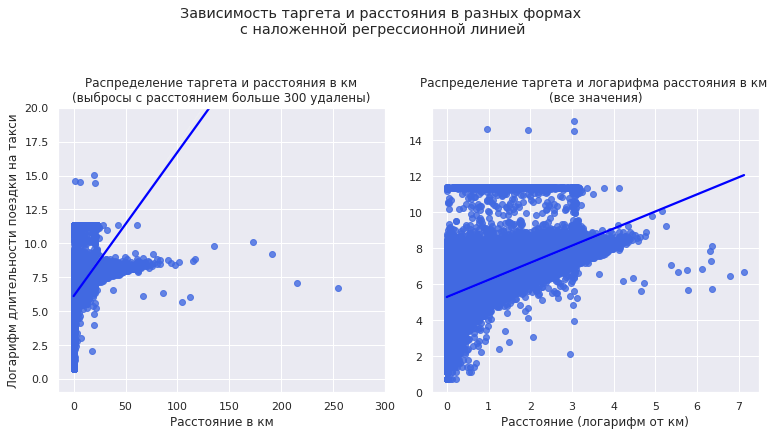

In [59]:
fig, axs = plt.subplots(ncols=2, figsize=(12, 6.5))

sns.regplot(x='haversine', y='log_trip_duration', data=plot_data, ax=axs[0], n_boot=1, scatter_kws={"color": "royalblue"}, line_kws={"color": "blue"})
axs[0].set_xlim(-15, 300)
axs[0].set_ylim(-1, 20)
axs[0].set_ylabel('Логарифм длительности поездки на такси')
axs[0].set_xlabel('Расстояние в км')
axs[0].set_title('Распределение таргета и расстояния в км\n(выбросы с расстоянием больше 300 удалены)')

sns.regplot(x='log_haversine', y='log_trip_duration', data=plot_data, ax=axs[1], n_boot=1, scatter_kws={"color": "royalblue"}, line_kws={"color": "blue"})
axs[1].set_xlabel('Расстояние (логарифм от км)')
axs[1].set_ylabel('')
axs[1].set_title('Распределение таргета и логарифма расстояния в км \n(все значения)')

fig.suptitle('Зависимость таргета и расстояния в разных формах \nс наложенной регрессионной линией')
fig.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

Text(0.5, 1.0, 'Корреляция таргета, haversine и log_haversine')

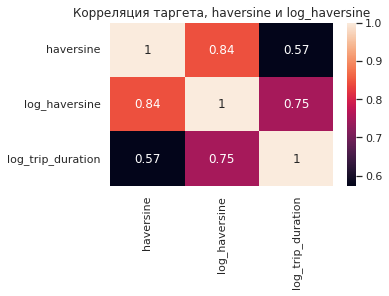

In [60]:
fig, ax = plt.subplots(figsize=(5,3))
ax = sns.heatmap(data=plot_data.corr(), ax=ax, annot=True)
ax.set_title('Корреляция таргета, haversine и log_haversine')

В случае log_haversine прослеживается большая линейная зависимость, а также при взятии обычного haversine заметны явные выбросы, влияющие на результат.

Также не накладывая ограничение заметно, что есть странные значения с обычным временем, но расстоянием больше 500 км

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

In [61]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
X_train['mean_speed'] = X_train['haversine'] / (np.expm1(y_train) / (3600))
X_train['mean_speed']

502213     18.712035
505504     16.301937
381784     13.116510
835757     15.978418
1391835    12.740235
             ...    
1392611     9.602919
1216442    17.448545
256742     13.358892
253456      7.638849
1015882    10.538328
Name: mean_speed, Length: 1021050, dtype: float64

<Axes: title={'center': 'Распределение средней скорости движения такси'}, xlabel='Средняя скорость движения такси км\\ч', ylabel='Число записей в train'>

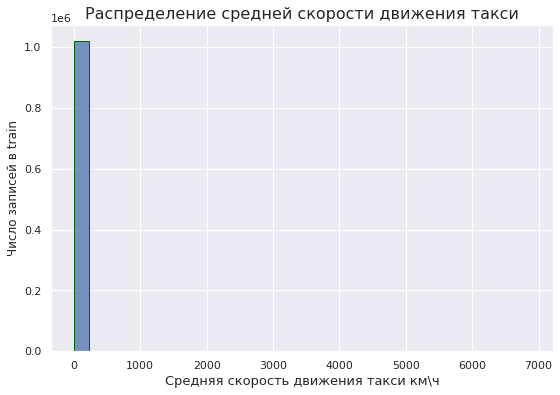

In [62]:
fig, ax = plt.subplots(figsize=(9,6))
plt.title('Распределение средней скорости движения такси', fontsize=16)
plt.xlabel('Средняя скорость движения такси км\ч', fontsize=13)
plt.ylabel('Число записей в train')
sns.histplot(X_train['mean_speed'], bins=30, ax=ax, edgecolor='darkgreen')

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

In [63]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
speed_quant = np.quantile(X_train['mean_speed'], q=0.9995)
print(f'Квантиль уровня 0.9995: {speed_quant}')

Квантиль уровня 0.9995: 59.33873606446644


<Axes: title={'center': 'Распределение средней скорости движения такси для значений квантили 0.9995'}, xlabel='Средняя скорость движения в км\\ч', ylabel='Число записей'>

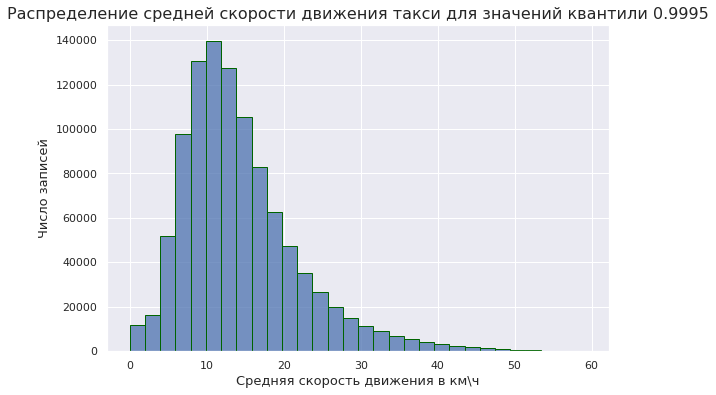

In [64]:
fig, ax = plt.subplots(figsize=(9,6))
plt.title('Распределение средней скорости движения такси для значений квантили 0.9995', fontsize=16)
plt.xlabel('Средняя скорость движения в км\ч', fontsize=13)
plt.ylabel('Число записей', fontsize=13)
sns.histplot(X_train['mean_speed'].loc[X_train['mean_speed'] < speed_quant],
             bins=30,
             ax=ax,
             edgecolor='darkgreen')

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

In [65]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
df_speed_corr = X_train.groupby(['day_of_week', 'hour_number']).median()['mean_speed'].to_frame()

monday = df_speed_corr.loc[(0, )].to_numpy().squeeze()
tuesday = df_speed_corr.loc[(1, )].to_numpy().squeeze()
wednesday = df_speed_corr.loc[(2, )].to_numpy().squeeze()
thursday = df_speed_corr.loc[(3, )].to_numpy().squeeze()
friday = df_speed_corr.loc[(4, )].to_numpy().squeeze()
saturday = df_speed_corr.loc[(5, )].to_numpy().squeeze()
sunday = df_speed_corr.loc[(6, )].to_numpy().squeeze()

df_month_hour_speed = pd.DataFrame([monday, tuesday, wednesday, thursday, friday, saturday, sunday])

[Text(0, 0.5, 'Понедельник'),
 Text(0, 1.5, 'Вторник'),
 Text(0, 2.5, 'Среда'),
 Text(0, 3.5, 'Четверг'),
 Text(0, 4.5, 'Пятница'),
 Text(0, 5.5, 'Суббота'),
 Text(0, 6.5, 'Воскресенье')]

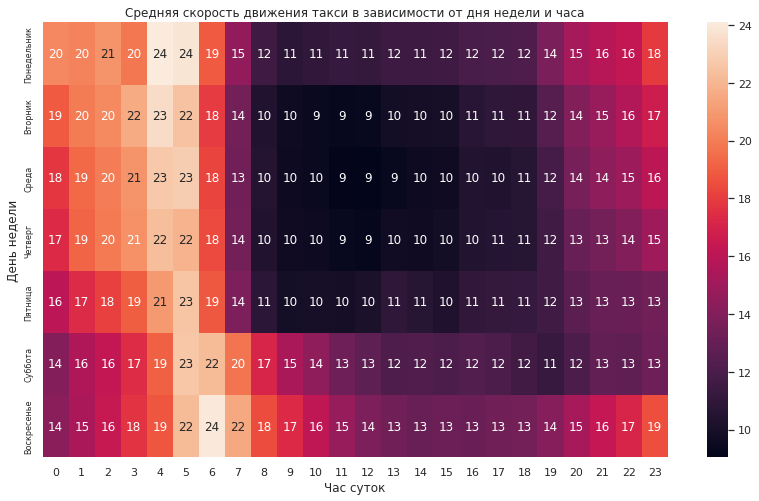

In [66]:
fig, ax = plt.subplots(figsize=(14, 8))
ax = sns.heatmap(df_month_hour_speed, annot=True, fmt='.0f', ax=ax)

ax.set_title('Средняя скорость движения такси в зависимости от дня недели и часа')
ax.set_xlabel('Час суток', fontsize=12)
ax.set_ylabel('День недели', fontsize=12)
ax.set_yticklabels(['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], fontsize=8)

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?
**Ответ**: Мы находили значение скорости с помощью таргета, который будет недоступен

In [67]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
X_train = X_train.drop('mean_speed', axis='columns')
X_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,day_of_week,month_number,hour_number,day_of_year,anormal_jan,anormal_may,haversine
502213,id1615460,2,2016-06-26 09:27:45,2,-74.013710,40.645393,-73.989510,40.669369,N,646,6,6,9,178,0,0,3.357771
505504,id3415975,1,2016-06-26 23:48:52,1,-74.007042,40.704967,-73.978287,40.728909,N,795,6,6,23,178,0,0,3.600011
381784,id2966434,2,2016-02-12 09:23:18,1,-73.958771,40.777939,-73.980530,40.770168,N,556,4,2,9,43,0,0,2.025772
835757,id1640176,2,2016-03-16 18:20:37,1,-73.970787,40.761066,-73.960129,40.775440,N,413,2,3,18,76,0,0,1.833080
1391835,id2659223,1,2016-04-14 19:57:43,2,-73.987328,40.760590,-74.007675,40.740807,N,788,3,4,19,105,0,0,2.788696


**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

**Ответ**: Заметно, что скорость максимальна рано утром(1-5) в будние дни и утром(5-7) в выходные
Скорость минимальна в будние дни с 8 до 17, можем сделать вывод, что она минимальна из за высокого трафика на дорогах в это время суток

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

In [68]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
good_traffic = {
    'monday' : set([0,1,2,3,4,5]),
    'tuesday' : set([1, 2, 3, 4, 5]),
    'wednesday' : set([2, 3, 4, 5]),
    'thursday' : set([2, 3, 4, 5]),
    'friday' : set([4, 5]),
    'saturday' : set([5, 6, 7]),
    'sunday' : set([5, 6, 7])
}

bad_traffic = {
    "monday": set(),
    "tuesday": set([8, 9, 10, 11, 12, 13, 14, 15]),
    "wednesday": set([8, 9, 10, 11, 12, 13, 14, 15, 16, 17]),
    "thursday": set([8, 9, 10, 11, 12, 13, 14, 15, 16]),
    "friday": set([9, 10, 11, 12, 15]),
    "saturday": set(),
    "sunday": set()
}

In [69]:
train_df['good_traffic'] = 0
train_df.loc[(train_df['day_of_week'] == 0) & (train_df['hour_number'].isin(good_traffic['monday'])), 'good_traffic'] += 1 
train_df.loc[(train_df['day_of_week'] == 1) & (train_df['hour_number'].isin(good_traffic['tuesday'])), 'good_traffic'] += 1 
train_df.loc[(train_df['day_of_week'] == 2) & (train_df['hour_number'].isin(good_traffic['wednesday'])), 'good_traffic'] += 1 
train_df.loc[(train_df['day_of_week'] == 3) & (train_df['hour_number'].isin(good_traffic['thursday'])), 'good_traffic'] += 1 
train_df.loc[(train_df['day_of_week'] == 4) & (train_df['hour_number'].isin(good_traffic['friday'])), 'good_traffic'] += 1 
train_df.loc[(train_df['day_of_week'] == 5) & (train_df['hour_number'].isin(good_traffic['saturday'])), 'good_traffic'] += 1 
train_df.loc[(train_df['day_of_week'] == 6) & (train_df['hour_number'].isin(good_traffic['sunday'])), 'good_traffic'] += 1 

train_df['bad_traffic'] = 0
train_df.loc[(train_df['day_of_week'] == 0) & (train_df['hour_number'].isin(bad_traffic['monday'])), 'bad_traffic'] += 1
train_df.loc[(train_df['day_of_week'] == 1) & (train_df['hour_number'].isin(bad_traffic['tuesday'])), 'bad_traffic'] += 1
train_df.loc[(train_df['day_of_week'] == 2) & (train_df['hour_number'].isin(bad_traffic['wednesday'])), 'bad_traffic'] += 1
train_df.loc[(train_df['day_of_week'] == 3) & (train_df['hour_number'].isin(bad_traffic['thursday'])), 'bad_traffic'] += 1
train_df.loc[(train_df['day_of_week'] == 4) & (train_df['hour_number'].isin(bad_traffic['friday'])), 'bad_traffic'] += 1
train_df.loc[(train_df['day_of_week'] == 5) & (train_df['hour_number'].isin(bad_traffic['saturday'])), 'bad_traffic'] += 1
train_df.loc[(train_df['day_of_week'] == 6) & (train_df['hour_number'].isin(bad_traffic['sunday'])), 'bad_traffic'] += 1


In [70]:
good_trips = train_df.loc[train_df['good_traffic'] == 1].shape
bad_trips = train_df.loc[train_df['bad_traffic'] == 1].shape

print(f'Число поездок по дорогам с свободным трафиком: {good_trips}')
print(f'Число поездок по дорогам с плохим трафиком: {bad_trips}')

Число поездок по дорогам с свободным трафиком: (55420, 21)
Число поездок по дорогам с плохим трафиком: (329187, 21)


**Задание 8 (0.25 балла)**. Как уже было замечено выше, на карте выделяются две точки вдали от Манхэттена. Для каждой из них добавьте в выборку два признака: началась ли поездка в ней и закончилась ли она в ней.

In [71]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
# Признак для аэропорта им. Джона Кеннеди
train_df['is_pickup_jfk'] = 0
train_df['is_dropoff_jfk'] = 0

train_df.loc[((train_df['pickup_latitude'] > 40.62679) & (train_df['pickup_latitude'] < 40.66684)) & \
             ((train_df['pickup_longitude'] > -73.82156) & (train_df['pickup_longitude'] < -73.75402)), 'is_pickup_jfk'] += 1

train_df.loc[((train_df['dropoff_latitude'] > 40.62679) & (train_df['dropoff_latitude'] < 40.66684)) & \
             ((train_df['dropoff_longitude'] > -73.82156) & (train_df['dropoff_longitude'] < -73.75402)), 'is_dropoff_jfk'] += 1

# Признак для аэропорта Ла-Гуардия
train_df['is_pickup_lg'] = 0
train_df['is_dropoff_lg'] = 0

train_df.loc[((train_df['pickup_latitude'] > 40.76622) & (train_df['pickup_latitude'] < 40.78152)) & \
             ((train_df['pickup_longitude'] > -73.88796) & (train_df['pickup_longitude'] < -73.85591)), 'is_pickup_lg'] += 1

train_df.loc[((train_df['dropoff_latitude'] > 40.76622) & (train_df['dropoff_latitude'] < 40.78152)) & \
             ((train_df['dropoff_longitude'] > -73.88796) & (train_df['dropoff_longitude'] < -73.85591)), 'is_dropoff_lg'] += 1



In [72]:
from_jfk_trips = train_df.loc[train_df['is_pickup_jfk'] == 1].shape[0]
to_jfk_trips = train_df.loc[train_df['is_dropoff_jfk'] == 1].shape[0]

from_lg_trips = train_df.loc[train_df['is_pickup_lg'] == 1].shape[0]
to_lg_trips = train_df.loc[train_df['is_dropoff_lg'] == 1].shape[0]

print(f'Число поездок из аэропорта им. Джона Кеннеди: {from_jfk_trips}')
print(f'Число поездок в аэропорт им. Джона Кеннеди: {to_jfk_trips}')
print(f'Число поездок из аэропорта Ла-Гуардия: {from_lg_trips}')
print(f'Число поездок в аэропорт Ла-Гуардия: {to_lg_trips}')

Число поездок из аэропорта им. Джона Кеннеди: 32120
Число поездок в аэропорт им. Джона Кеннеди: 13058
Число поездок из аэропорта Ла-Гуардия: 36964
Число поездок в аэропорт Ла-Гуардия: 18070


**Продемонстрируем часть поездок на карте:**




In [73]:
jfk_pickup = train_df.loc[train_df['is_pickup_jfk'] == 1]
jfk_dropoff = train_df.loc[train_df['is_dropoff_jfk'] == 1]

lg_pickup = train_df.loc[train_df['is_pickup_lg'] == 1]
lg_dropoff = train_df.loc[train_df['is_dropoff_lg'] == 1]

In [74]:
# Отправление - аэропорт им. Кеннеди
show_circles_on_map(jfk_pickup.sample(1000), 'pickup_latitude', 'pickup_longitude', color='red')

In [75]:
# Пункты назначения отправляющихся с аэропорта им. Джона Кеннеди
show_circles_on_map(jfk_pickup.sample(1000), "dropoff_latitude", "dropoff_longitude", "red")

In [76]:
# место назначения - аэропорт им. Джона Кеннеди
show_circles_on_map(jfk_dropoff.sample(1000), 'dropoff_latitude', 'dropoff_longitude', color='red')

In [77]:
# Откуда едут в аэропорт им. Джона Кеннеди
show_circles_on_map(jfk_dropoff.sample(1000), 'pickup_latitude', 'pickup_longitude', color='red')

Поездки в(-от) аэропорт(-а) Ла-Гуардия

In [78]:
# место отправления - аэропорт LG
show_circles_on_map(lg_pickup.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [79]:
# Куда едут из аэропорта LG
show_circles_on_map(lg_pickup.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

In [80]:
# место назначения - аэропорт LG
show_circles_on_map(lg_dropoff.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")


In [81]:
# посмотрим, откуда едут в аэропорт LG
show_circles_on_map(lg_dropoff.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

Text(0.5, 0, 'Флаг на точку назначения в \nаэропорту Ла-Гуардия')

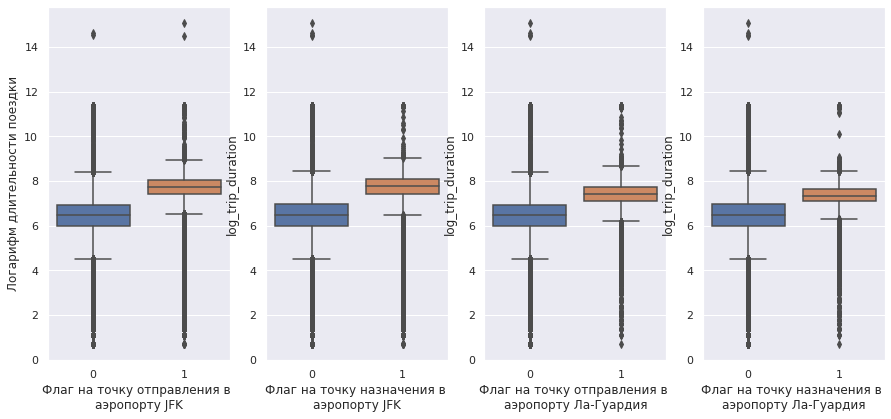

In [82]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
fig, axs = plt.subplots(ncols=4, figsize=(15, 6.5))

sns.boxplot(data=train_df, x='is_pickup_jfk', y='log_trip_duration', ax=axs[0])
axs[0].set_xlabel('Флаг на точку отправления в \nаэропорту JFK')
axs[0].set_ylabel('Логарифм длительности поездки')

sns.boxplot(data=train_df, x='is_dropoff_jfk', y='log_trip_duration', ax=axs[1])
axs[1].set_xlabel('Флаг на точку назначения в \nаэропорту JFK')

sns.boxplot(data=train_df, x='is_pickup_lg', y='log_trip_duration', ax=axs[2])
axs[2].set_xlabel('Флаг на точку отправления в \nаэропорту Ла-Гуардия')

sns.boxplot(data=train_df, x='is_dropoff_lg', y='log_trip_duration', ax=axs[3])
axs[3].set_xlabel('Флаг на точку назначения в \nаэропорту Ла-Гуардия')

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?
В первом случае признаки явно лучше. Разница в среднем таргете для первого аэропорта больше, наверное, т.к. он находится за городом, куда в среднем ехать дольше. Второй аэропорт же находится в городе, поэтому разница не столь значительна.

Вообще признаки получились не очень хорошими из-за большого количества выбросов


<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

In [83]:
def check_whole_area(df, lat, lon, new_feature):
    '''
    Функция проверяет по входящим координатам,
    находится ли объект в Манхэттене и печатает
    число отобранных объектов
    '''
    df[new_feature] = 0

    df.loc[((df[lat] > 40.69982) & (df[lat] < 40.80265)) & \
        ((df[lon] > -74.02096) & (df[lon] < -73.93779)), new_feature] += 1
    
    df_shape = df.loc[df[new_feature] == 1].shape
    print(f'Число интересующих поездок: {df_shape[0]}')

    return df

In [84]:
def show_lines_and_circles_on_map(points, line_color='red', weight=5, opacity=1.0, 
        need_points=False, data=None, latitude_column=None, longitude_column=None, 
        point_color='blue', radius=100):
    """
    Функция создает карту формата folium и
    рисует линии (обязательно) и круги (опционально).
    Центр карты - это средняя координата поданных на вход данных для линий.
    
    points - лист из кортежей, содержащий информацию о координатах, которые
    нужно соединить линией. В кортеже под 0 индексом находится широта,
    под индексом 1 - долгота.
    Функция возвращает карту - объект folium.
    """
    lats = np.mean([x[0] for x in points])
    lons = np.mean([x[1] for x in points])
    location = (lats, lons)
    m = folium.Map(location=location)

    folium.PolyLine(points, 
        color=line_color,
        weight=weight, 
        opacity=opacity
        ).add_to(m)

    if need_points:
        for _, row in data.iterrows():
            folium.Circle(
                radius=radius,
                location=(row[latitude_column], row[longitude_column]),
                color=point_color,
                fill_color=point_color,
                fill=True
            ).add_to(m)

    return m

In [85]:
def draw_extra_line_on_map(m, points, line_color='red', weight=5, opacity=1.0):
    """
    Функция добавляет новые линии на созданную ранее карту.
    
    m - карта формата folium.
    """

    folium.PolyLine(points, 
        color=line_color,
        weight=weight, 
        opacity=opacity
        ).add_to(m)

    return m

In [86]:
def make_grid_5x3(list_t):
    '''
    Функция создает симметричную сетку 5 на 3 из координат.
    По умолчанию используются следующие координаты р-на Манхэттен:
    up_l = (40.80265, -74.02096)
    up_r = (40.80265, -73.93779)
    down_l = (40.69982, -74.02096)
    down_r = (40.69982, -73.93779)
    list_t = [up_l, up_r, down_r, down_l, up_l]
    '''
    up_lons = np.linspace(list_t[0][1], list_t[1][1], 4)
    up_lats = np.ones(len(up_lons)) * list_t[0][0]
    up_cord = (up_lats, up_lons)
    up_cord = [(up_cord[0][i], up_cord[1][i]) for i in range(len(up_cord[0]))]

    down_lons = up_lons
    down_lats = np.ones(len(down_lons)) * list_t[2][0]
    down_cord = (down_lats, down_lons)
    down_cord = [(down_cord[0][i], down_cord[1][i]) for i in range(len(down_cord[0]))]

    left_lats = np.linspace(list_t[0][0], list_t[2][0], 6)
    left_lons = np.ones(len(left_lats)) * list_t[0][1]
    left_cord = (left_lats, left_lons)
    left_cord = [(left_cord[0][i], left_cord[1][i]) for i in range(len(left_cord[0]))]

    right_lats = left_lats
    right_lons = np.ones(len(right_lats)) * list_t[1][1]
    right_cord = (right_lats, right_lons)
    right_cord = [(right_cord[0][i], right_cord[1][i]) for i in range(len(right_cord[0]))]

    # задаем координаты в виде "линий"
    line_0 = left_cord
    line_1 = [(left_cord[i][0], down_cord[1][1]) for i in range(6)]
    line_2 = [(left_cord[i][0], down_cord[2][1]) for i in range(6)]
    line_3 = right_cord

    return line_0, line_1, line_2, line_3

In [87]:
from sklearn.base import BaseEstimator, TransformerMixin
    
class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        # по умолчанию используются следующие координаты р-на Манхэттен: 
        self.up_l = (40.80265, -74.02096)
        self.up_r = (40.80265, -73.93779)
        self.down_l = (40.69982, -74.02096)
        self.down_r = (40.69982, -73.93779)
    
    def show_map(self, df=None, with_points=False, point_feature=None, box_number=1, pickup_or_dropoff='pickup'):
        if with_points:                                                          # если нужно отрисовать точки - координаты поездок
            subset = df.loc[df[point_feature] == box_number]
            print(f'Размер выборки для визуализации: {subset.shape[0]} \
                \nНа карте: 1000 или меньше')

            if pickup_or_dropoff == 'pickup':                                    # выбираем, хотим ли мы отрисовать место назначения
                latitude_column = 'pickup_latitude'                              # или место отправления
                longitude_column = 'pickup_longitude'
            else:
                latitude_column = 'dropoff_latitude'
                longitude_column = 'dropoff_longitude'

            m = show_lines_and_circles_on_map(self.area, weight=8, opacity=1.0, 
                need_points=True, data=subset.sample(1000), latitude_column=latitude_column, 
                longitude_column=longitude_column, point_color="blue")
            m = draw_extra_line_on_map(m, [self.line_1[0], self.line_1[-1]])
            m = draw_extra_line_on_map(m, [self.line_2[0], self.line_2[-1]])

            for i in range(1, 5):
                m = draw_extra_line_on_map(m, [self.line_0[i], self.line_3[i]])
            return m

        m = show_lines_and_circles_on_map(self.area, weight=8, opacity=1.0)
        m = draw_extra_line_on_map(m, [self.line_1[0], self.line_1[-1]])
        m = draw_extra_line_on_map(m, [self.line_2[0], self.line_2[-1]])

        for i in range(1, 5):
            m = draw_extra_line_on_map(m, [self.line_0[i], self.line_3[i]])
        return m

    
    def fit(self, X=None, y=None):
        # создаем сетку, которая будет использоваться для создания признаков и визаулизации
        area = [self.up_l, self.up_r, self.down_r, self.down_l, self.up_l]
        self.line_0, self.line_1, self.line_2, self.line_3 = make_grid_5x3(area)
        self.area = area
        
        return self

    def transform(self, X, y=None):
        df = X.copy()

        # проверим, какие поездки начинаются или заканчиваются в Манхэттене
        df = check_whole_area(df, 'pickup_latitude', 'pickup_longitude', new_feature='is_manh_pickup')
        df = check_whole_area(df, 'dropoff_latitude', 'dropoff_longitude', new_feature='is_manh_dropoff')
        df['box_manh_pickup'] = -1
        df['box_manh_dropoff'] = -1

        # заполним новые признаки - поездка началась или закончилась 
        # в той или иной ячейке новой сетки
        # обработаем ячейки с 1 по 5:
        for i in range(5):
            df.loc[((df['pickup_latitude'] > self.line_0[i+1][0]) & (df['pickup_latitude'] < self.line_0[i][0])) & \
                ((df['pickup_longitude'] > self.line_0[0][1]) & (df['pickup_longitude'] < self.line_1[0][1])), 'box_manh_pickup'] = i+1

            df.loc[((df['dropoff_latitude'] > self.line_0[i+1][0]) & (df['dropoff_latitude'] < self.line_0[i][0])) & \
                ((df['dropoff_longitude'] > self.line_0[0][1]) & (df['dropoff_longitude'] < self.line_1[0][1])), 'box_manh_dropoff'] = i+1

        # обработаем ячейки с 6 по 10:
        for i in range(5):
            df.loc[((df['pickup_latitude'] > self.line_1[i+1][0]) & (df['pickup_latitude'] < self.line_1[i][0])) & \
                ((df['pickup_longitude'] > self.line_1[0][1]) & (df['pickup_longitude'] < self.line_2[0][1])), 'box_manh_pickup'] = i+6

            df.loc[((df['dropoff_latitude'] > self.line_1[i+1][0]) & (df['dropoff_latitude'] < self.line_1[i][0])) & \
                ((df['dropoff_longitude'] > self.line_1[0][1]) & (df['dropoff_longitude'] < self.line_2[0][1])), 'box_manh_dropoff'] = i+6

        # обработаем ячейки с 11 по 15:
        for i in range(5):
            df.loc[((df['pickup_latitude'] > self.line_2[i+1][0]) & (df['pickup_latitude'] < self.line_2[i][0])) & \
                ((df['pickup_longitude'] > self.line_2[0][1]) & (df['pickup_longitude'] < self.line_3[0][1])), 'box_manh_pickup'] = i+11

            df.loc[((df['dropoff_latitude'] > self.line_2[i+1][0]) & (df['dropoff_latitude'] < self.line_2[i][0])) & \
                ((df['dropoff_longitude'] > self.line_2[0][1]) & (df['dropoff_longitude'] < self.line_3[0][1])), 'box_manh_dropoff'] = i+11
        
        return df


Еще раз разделим выборку, т.к. ранее было создано много новых признаков; было удобно делать это сразу для всей выборки:


In [88]:
X_train, X_test = train_test_split(train_df, train_size=0.7, test_size=0.3, random_state=13)

y_train = X_train['log_trip_duration']
y_test = X_test['log_trip_duration']

X_train = X_train.drop('log_trip_duration', axis='columns')
X_test = X_test.drop('log_trip_duration', axis='columns')

In [89]:
GridTrans = MapGridTransformer()


In [90]:
GridTrans.fit(X_train)
X_train = GridTrans.transform(X_train)
X_test = GridTrans.transform(X_test)

# в начале посмотрим на сетку и то, как поездки ложатся на нее:
GridTrans.show_map(df=X_train, with_points=True, point_feature='is_manh_pickup', pickup_or_dropoff='pickup')


Число интересующих поездок: 934288
Число интересующих поездок: 888569
Число интересующих поездок: 399950
Число интересующих поездок: 380392
Размер выборки для визуализации: 934288                 
На карте: 1000 или меньше


In [91]:
GridTrans.show_map(df=X_train, with_points=True, point_feature='box_manh_pickup', box_number=11, pickup_or_dropoff='pickup')

Размер выборки для визуализации: 28003                 
На карте: 1000 или меньше


**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [92]:
categorial_train = X_train[['day_of_week', 'month_number', 'hour_number', 
       'anormal_jan', 'anormal_may', 'good_traffic', 'bad_traffic', 'is_pickup_jfk', 
       'is_dropoff_jfk', 'is_pickup_lg', 'is_dropoff_lg', 
       'box_manh_pickup', 'box_manh_dropoff']]
numeric_train = X_train[['log_haversine', 'day_of_year']]

categorial_test = X_test[['day_of_week', 'month_number', 'hour_number', 
       'anormal_jan', 'anormal_may', 'good_traffic', 'bad_traffic', 'is_pickup_jfk', 
       'is_dropoff_jfk', 'is_pickup_lg', 'is_dropoff_lg', 
       'box_manh_pickup', 'box_manh_dropoff']]
numeric_test = X_test[['log_haversine', 'day_of_year']]


In [93]:
ohe = OneHotEncoder(sparse=False)

categorial_train_tr = ohe.fit_transform(categorial_train)
categorial_test_tr = ohe.transform(categorial_test)

scaler = StandardScaler()

numeric_train_tr = scaler.fit_transform(numeric_train)
numeric_test_tr = scaler.transform(numeric_test)


/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [94]:
X_train_trans = np.concatenate((categorial_train_tr, numeric_train_tr), axis=1)
X_test_trans = np.concatenate((categorial_test_tr, numeric_test_tr), axis=1)

In [95]:
model = Ridge(random_state=13)

model.fit(X_train_trans, y_train)
pred_test = model.predict(X_test_trans)
pred_train = model.predict(X_train_trans)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')


RMSLE на тесте: 0.474, 
RMSLE на трейне: 0.476


Стало намного лучше, чем было раньше!

Прошлые результаты:
- 0.7876 для предыдущих признаков
- 0.7956 изначально

In [96]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:


- vendor_id - у каждого из провайдеров может быть своя специфика, например, разница в моделях машин
- passenger_count - поездки для одного человека могут быть короче, а для большего кол-ва дольше, к примеру, из-за того что надо развезти по нескольким точкам сразу много человек или банально отвести на большое расстояние(куда один человек не поехал бы из-за цены на такую поездку)
- store_and_fwd_flag - отсутствие связи может свидетельствовать о сбое


In [97]:
n_id = train_df['vendor_id'].nunique()
set_id = set(train_df['vendor_id'].unique())

print(f'Признак `vendor_id` принимает {n_id} значений(-я) \nВот они: {set_id}\n')

n_passenger = train_df['passenger_count'].nunique()
set_passenger = set(train_df['passenger_count'].unique())

print(f'Признак `passenger_count` принимает {n_passenger} значений(-я) \nВот они: {set_passenger}\n')

n_flag = train_df['store_and_fwd_flag'].nunique()
set_flag = set(train_df['store_and_fwd_flag'].unique())

print(f'Признак `store_and_fwd_flag` принимает {n_flag} значений(-я) \nВот они: {set_flag}')


Признак `vendor_id` принимает 2 значений(-я) 
Вот они: {1, 2}

Признак `passenger_count` принимает 10 значений(-я) 
Вот они: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9}

Признак `store_and_fwd_flag` принимает 2 значений(-я) 
Вот они: {'N', 'Y'}


Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

Text(0.5, 0.035, 'Боксплоты для трех новых признаков и таргета')

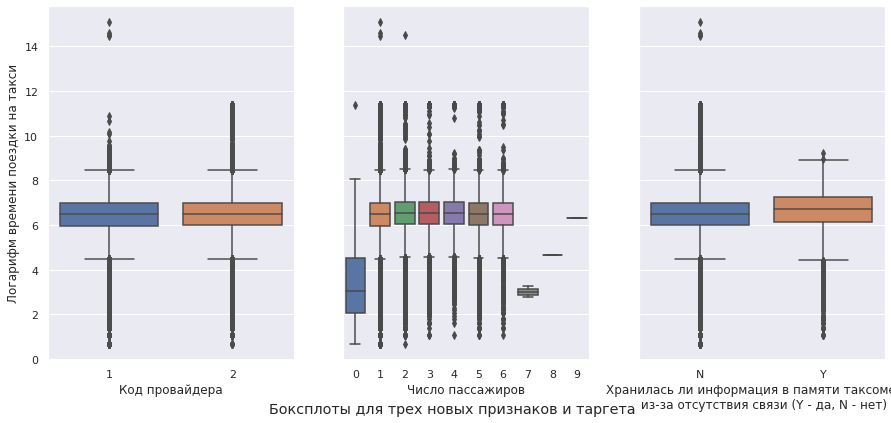

In [98]:
fig, axs = plt.subplots(ncols=3, figsize=(15,6.5))

sns.boxplot(data=train_df, x='vendor_id', y='log_trip_duration', ax=axs[0])
axs[0].set_ylabel('Логарифм времени поездки на такси')
axs[0].set_xlabel('Код провайдера')

sns.boxplot(data=train_df, x='passenger_count', y='log_trip_duration', ax=axs[1])
axs[1].set_ylabel('')
axs[1].set_yticklabels('')
axs[1].set_xlabel('Число пассажиров')

sns.boxplot(data=train_df, x='store_and_fwd_flag', y='log_trip_duration', ax=axs[2])
axs[2].set_ylabel('')
axs[2].set_yticklabels('')
axs[2].set_xlabel('Хранилась ли информация в памяти таксометра\n из-за отсутствия связи (Y - да, N - нет)')

fig.suptitle('Боксплоты для трех новых признаков и таргета', y=0.035)


Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [99]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
train_df['vendor_id'] = (train_df["vendor_id"].values == 2).astype(int)
train_df['store_and_fwd_flag'] = (train_df["store_and_fwd_flag"].values == 'Y').astype(int)


In [100]:
n_id = train_df['vendor_id'].nunique()
set_id = set(train_df['vendor_id'].unique())

print(f'Признак `vendor_id` принимает {n_id} значений(-я) \nВот они: {set_id}\n')

n_flag = train_df['store_and_fwd_flag'].nunique()
set_flag = set(train_df['store_and_fwd_flag'].unique())

print(f'Признак `store_and_fwd_flag` принимает {n_flag} значений(-я) \nВот они: {set_flag}')


Признак `vendor_id` принимает 2 значений(-я) 
Вот они: {0, 1}

Признак `store_and_fwd_flag` принимает 2 значений(-я) 
Вот они: {0, 1}


In [101]:
X_train, X_test = train_test_split(train_df, train_size=0.7, test_size=0.3, random_state=13)

In [102]:
GridTrans = MapGridTransformer()
GridTrans.fit(X_train)
X_train = GridTrans.transform(X_train)
X_test = GridTrans.transform(X_test)

Число интересующих поездок: 934288
Число интересующих поездок: 888569
Число интересующих поездок: 399950
Число интересующих поездок: 380392


**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

- Видно, что признак, отвечающий за код провайдера, скорее всего, будет бесполезным, т.к. его ящики с усами идентичны, исключая лишь тот факт, что у одного из провайдеров есть выбросы, а у второго - нет.

- В признаке, отвечающим за число пассажиров, смущают поездки, у которых было 0 пассажиров

- Для признака, отвечающего за хранение информации в таксометре при отсутствии связи, дело лучше: в положительном случае есть небольшое отклонение вверх относительно отрицательных случаев, и их достаточно много 

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [103]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
cat_cols = ['day_of_week', 'month_number', 'hour_number', 
       'anormal_jan', 'anormal_may', 'good_traffic', 'bad_traffic', 'is_pickup_jfk', 
       'is_dropoff_jfk', 'is_pickup_lg', 'is_dropoff_lg', 
       'box_manh_pickup', 'box_manh_dropoff']

num_cols = ['log_haversine', 'day_of_year']


In [104]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(), cat_cols),
    ('scaling', StandardScaler(), num_cols)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(random_state=13))
])

model = pipeline.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSLE на тесте: {round(rmse_test, 4)}, \nRMSLE на трейне: {round(rmse_train, 4)}')


RMSLE на тесте: 0.474, 
RMSLE на трейне: 0.476


In [105]:
cat_cols.extend(['vendor_id', 'passenger_count', 'store_and_fwd_flag'])

In [106]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(), cat_cols),
    ('scaling', StandardScaler(), num_cols)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(random_state=42))
])

model = pipeline.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSE на train: {round(rmse_train, 4)}, \nRMSE на test: {round(rmse_test, 4)}')


RMSE на train: 0.4755, 
RMSE на test: 0.4735


Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты: с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите обучающую выборку от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

In [107]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
# статистическая граница выбросов

q_005 = np.quantile(X_train['log_trip_duration'], q=0.005)
q_0025 = np.quantile(X_train['log_trip_duration'], q=0.0025)
q_25 = np.quantile(X_train['log_trip_duration'], q=0.25)
q_75 = np.quantile(X_train['log_trip_duration'], q=0.75)

delta = q_75 - q_25
b_u = q_75 + delta*3
b_d = q_25 - delta*3

print(f'Статистический интервал типичных значений: [{round(b_d, 3)}; {round(b_u, 3)}]')
print(f'Квантиль уровня 0.005: {round(q_005, 3)}')
print(f'Квантиль уровня 0.0025: {round(q_0025, 3)}')
print(f'Содержательно значение логарифма 3 равно: {round(np.expm1(3), 0)} секунд')

Статистический интервал типичных значений: [3.0; 9.968]
Квантиль уровня 0.005: 3.932
Квантиль уровня 0.0025: 3.045
Содержательно значение логарифма 3 равно: 19.0 секунд


Text(0.5, 0.035, 'Гистограммы логарифма времени поездки на такси: \nс аномально маленькими значениями и без них')

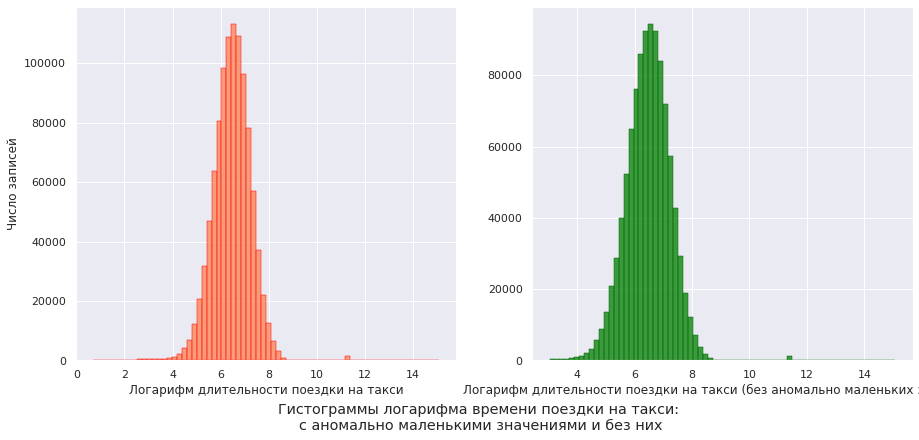

In [108]:
fig, axs = plt.subplots(ncols=2, figsize=(15,6.5))

sns.histplot(X_train['log_trip_duration'],
             bins=70,
             ax=axs[0], 
             color='coral',
             edgecolor='red')
axs[0].set_ylabel('Число записей')
axs[0].set_xlabel('Логарифм длительности поездки на такси')

sns.histplot(X_train.loc[X_train['log_trip_duration'] > 3]['log_trip_duration'],
             bins=70,
             ax=axs[1], 
             color='green',
             edgecolor='darkgreen')
axs[1].set_ylabel('')
axs[1].set_xlabel('Логарифм длительности поездки на такси (без аномально маленьких значений)')

fig.suptitle('Гистограммы логарифма времени поездки на такси: \nс аномально маленькими значениями и без них', y=0.035)

In [109]:
# статистическая граница выбросов

q_995 = np.quantile(X_train['log_haversine'], q=0.995)
q_25 = np.quantile(X_train['log_haversine'], q=0.25)
q_75 = np.quantile(X_train['log_haversine'], q=0.75)

delta = q_75 - q_25
b_u = q_75 + delta*3
b_d = q_25 - delta*3

print(f'Статистический интервал типичных значений: [{round(b_d, 3)}; {round(b_u, 3)}]')
print(f'Квантиль уровня 0.995: {round(q_995, 3)}')
print(f'Содержательно значение логарифма 3.5 равно: {round(np.expm1(3.5), 2)} км')


Статистический интервал типичных значений: [-1.541; 3.927]
Квантиль уровня 0.995: 3.116
Содержательно значение логарифма 3.5 равно: 32.12 км


Text(0.5, 0.035, 'Гистограммы логарифма расстояния поездки на такси: \nс аномально большими значениями и без них')

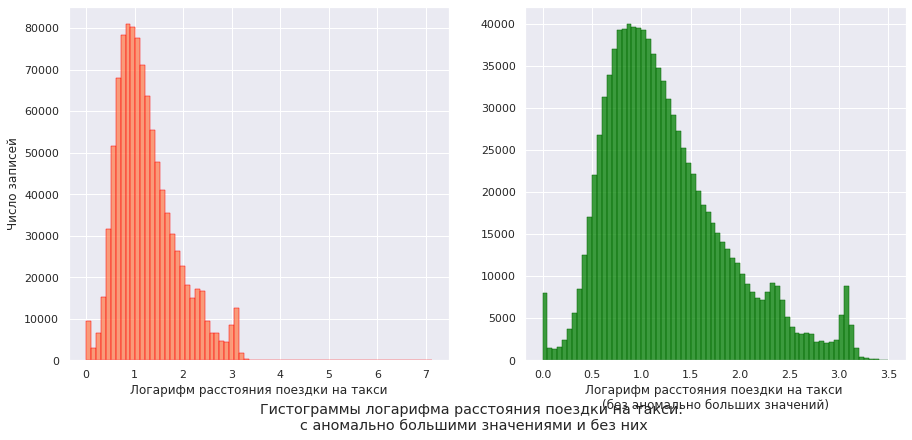

In [110]:
fig, axs = plt.subplots(ncols=2, figsize=(15,6.5))

sns.histplot(X_train['log_haversine'],
             bins=70,
             ax=axs[0], 
             color='coral',
             edgecolor='red')
axs[0].set_ylabel('Число записей')
axs[0].set_xlabel('Логарифм расстояния поездки на такси')

sns.histplot(X_train.loc[X_train['log_haversine'] < 3.5]['log_haversine'],
             bins=70,
             ax=axs[1], 
             color='green',
             edgecolor='darkgreen')
axs[1].set_ylabel('')
axs[1].set_xlabel('Логарифм расстояния поездки на такси \n(без аномально больших значений)')

fig.suptitle('Гистограммы логарифма расстояния поездки на такси: \nс аномально большими значениями и без них', y=0.035)

In [111]:
model = pipeline.fit(X_train, y_train)
pred_train = model.predict(X_train)

residuals = pred_train - y_train
residuals_sq = np.sqrt(residuals ** 2)

In [112]:
# статистическая граница выбросов

q_995 = np.quantile(residuals_sq, q=0.995)
q_25 = np.quantile(residuals_sq, q=0.25)
q_75 = np.quantile(residuals_sq, q=0.75)

delta = q_75 - q_25
b_u = q_75 + delta*3
b_d = q_25 - delta*3

print(f'Статистический интервал типичных значений: [{round(b_d, 3)}; {round(b_u, 3)}]')
print(f'Квантиль уровня 0.995: {round(q_995, 3)}')


Статистический интервал типичных значений: [-0.844; 1.393]
Квантиль уровня 0.995: 2.047


Text(0.5, 0.035, '')

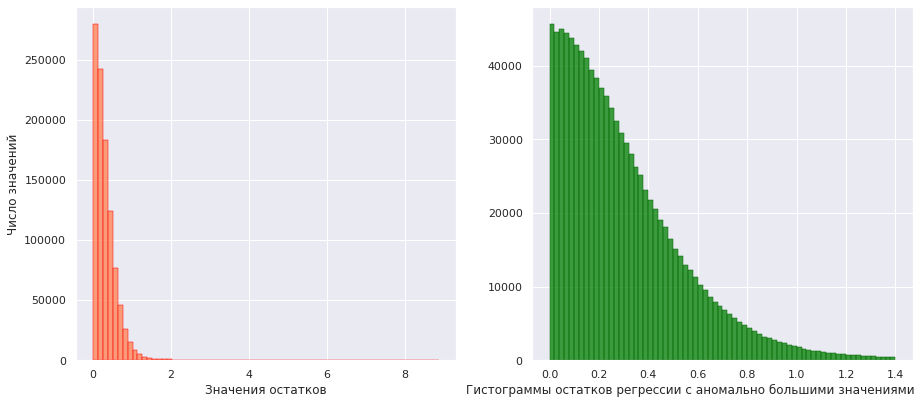

In [113]:
fig, axs = plt.subplots(ncols=2, figsize=(15,6.5))

sns.histplot(residuals_sq,
             bins=70,
             ax=axs[0], 
             color='coral',
             edgecolor='red')
axs[0].set_ylabel('Число значений')
axs[0].set_xlabel('Значения остатков')

sns.histplot(residuals_sq.loc[residuals_sq < 1.4],
             bins=70,
             ax=axs[1], 
             color='green',
             edgecolor='darkgreen')
axs[1].set_ylabel('')
axs[1].set_xlabel('Гистограммы остатков регрессии с аномально большими значениями и без них')

fig.suptitle('', y=0.035)

In [114]:
start = X_train.shape[0]
print(f'Было: {start}')

# время
bad_time_ind = X_train.loc[X_train['log_trip_duration'] < 3].index
print(f'Плохих значений {len(bad_time_ind)} штук')
X_train = X_train.drop(bad_time_ind)
y_train = y_train.drop(bad_time_ind)

del1 = X_train.shape[0]
print(f'Удалено {start - del1}')

# расстояние
bad_distance_ind = X_train.loc[X_train['log_haversine'] > 3.5].index
print(f'Плохих значений {len(bad_distance_ind)} штук')
X_train = X_train.drop(bad_distance_ind)
y_train = y_train.drop(bad_distance_ind)

del2 = X_train.shape[0]
print(f'Удалено {del1 - del2}')

# остатки
bad_res_ind = residuals_sq.loc[residuals_sq > 1.4].index
print(f'Плохих значений {len(bad_res_ind)} штук')
X_train = X_train.drop(bad_res_ind, errors='ignore')
y_train = y_train.drop(bad_res_ind, errors='ignore')

del3 = X_train.shape[0]
print(f'Удалено {del2 - del3}')
print(f'Осталось {del3}')


Было: 1021050
Плохих значений 2500 штук
Удалено 2500
Плохих значений 308 штук
Удалено 308
Плохих значений 11201 штук
Удалено 8830
Осталось 1009412


Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Попробуйте объединить редкие категории в одну. Естественно, делать это нужно только для действительно редких категорий.

In [115]:
X_train[cat_cols].nunique()

day_of_week            7
month_number           6
hour_number           24
anormal_jan            2
anormal_may            2
good_traffic           2
bad_traffic            2
is_pickup_jfk          2
is_dropoff_jfk         2
is_pickup_lg           2
is_dropoff_lg          2
box_manh_pickup       16
box_manh_dropoff      16
vendor_id              2
passenger_count        8
store_and_fwd_flag     2
dtype: int64

In [116]:
X_train['box_manh_pickup'].value_counts()

 8     256425
 7     136717
 12    111859
 9      97060
 4      96863
-1      84053
 3      68722
 5      52042
 6      43780
 11     27715
 13     12740
 10     10699
 2       5457
 15      4185
 14      1094
 1          1
Name: box_manh_pickup, dtype: int64

In [117]:
X_train['box_manh_dropoff'].value_counts()

 8     238884
-1     129602
 7     121487
 12    109219
 9      86986
 4      82118
 3      62391
 5      52776
 6      44115
 11     35974
 13     14282
 10     12019
 15      9165
 2       6472
 14      3889
 1         33
Name: box_manh_dropoff, dtype: int64

In [118]:
X_train['passenger_count'].value_counts()

1    715003
2    145577
5     54131
3     41463
6     33427
4     19793
0        17
7         1
Name: passenger_count, dtype: int64

Объединим некоторые признаки в один:
- Прямоугольники манхэттена с номерами 1,2,14,15, т.к. в них очень мало поездок и они по сути вне манхэттена
- число пассажиров, равное 0,7-9, их количество мало и они очень странные

In [119]:
X_train.loc[(X_train['box_manh_pickup'] == 1) | (X_train['box_manh_pickup'] == 2) \
    | (X_train['box_manh_pickup'] == 14) | (X_train['box_manh_pickup'] == 15), 'box_manh_pickup'] = 99
X_train.loc[(X_train['box_manh_dropoff'] == 1) | (X_train['box_manh_dropoff'] == 2) \
    | (X_train['box_manh_dropoff'] == 14) | (X_train['box_manh_dropoff'] == 15), 'box_manh_dropoff'] = 99
X_train.loc[(X_train['passenger_count'] == 0) | (X_train['passenger_count'] == 7) \
    | (X_train['passenger_count'] == 8) | (X_train['passenger_count'] == 9), 'passenger_count'] = -1


In [120]:
X_test.loc[(X_test['box_manh_pickup'] == 1) | (X_test['box_manh_pickup'] == 2) \
    | (X_test['box_manh_pickup'] == 14) | (X_test['box_manh_pickup'] == 15), 'box_manh_pickup'] = 99
X_test.loc[(X_test['box_manh_dropoff'] == 1) | (X_test['box_manh_dropoff'] == 2) \
    | (X_test['box_manh_dropoff'] == 14) | (X_test['box_manh_dropoff'] == 15), 'box_manh_dropoff'] = 99
X_test.loc[(X_test['passenger_count'] == 0) | (X_test['passenger_count'] == 7) \
    | (X_test['passenger_count'] == 8) | (X_test['passenger_count'] == 9), 'passenger_count'] = -1


Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

In [121]:
model = pipeline.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSE на тесте: {round(rmse_test, 4)}, \nRMSE на трейне: {round(rmse_train, 4)}')

RMSE на тесте: 0.4739, 
RMSE на трейне: 0.3872


**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [122]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
before = X_train[cat_cols].shape[1]

ohe = OneHotEncoder(sparse=False)
after = ohe.fit_transform(X_train[cat_cols]).shape[1]

print(f'До кодирования кол-во кат. признаков: {before} \nПосле кодирования кол-во кат. признаков: {after}')


/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


До кодирования кол-во кат. признаков: 16 
После кодирования кол-во кат. признаков: 90


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [123]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
pipeline_lasso = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso(random_state=42))
])

model = pipeline_lasso.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSE на train: {rmse_train}, \nRMSE на test: {rmse_test}')


RMSE на train: 0.7312128000013419, 
RMSE на test: 0.7949351680059882


In [124]:
pipeline_ridge = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(random_state=42))
])

model = pipeline_ridge.fit(X_train, y_train)
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)

print(f'RMSE на train: {rmse_train}, \nRMSE на test: {rmse_test}')


RMSE на train: 0.387220419538226, 
RMSE на test: 0.47389867612341635


Видно, что Ridge показывает результат лучше почти в два раза(далее увидим, что Lasso дает константный прогноз)

Разбейте обучающую выборку на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [125]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
X_train_mini, X_val, y_train_mini, y_val = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=13)

In [126]:
ohe = OneHotEncoder(sparse=False)
X_val_trans0 = ohe.fit_transform(X_val[cat_cols])

scaler = StandardScaler()
X_val_trans1 = scaler.fit_transform(X_val[num_cols])

X_val_trans = np.concatenate((X_val_trans0, X_val_trans1), axis=1)


/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [127]:
alphas_ridge = np.logspace(-5, 2, 20)
alphas_ridge

array([1.00000000e-05, 2.33572147e-05, 5.45559478e-05, 1.27427499e-04,
       2.97635144e-04, 6.95192796e-04, 1.62377674e-03, 3.79269019e-03,
       8.85866790e-03, 2.06913808e-02, 4.83293024e-02, 1.12883789e-01,
       2.63665090e-01, 6.15848211e-01, 1.43844989e+00, 3.35981829e+00,
       7.84759970e+00, 1.83298071e+01, 4.28133240e+01, 1.00000000e+02])

In [128]:
ridge_cv = GridSearchCV(Ridge(random_state=42), 
        [{"alpha": alphas_ridge}], 
        scoring="neg_root_mean_squared_error", 
        cv=10)

ridge_cv.fit(X_val_trans, y_val)

best_alpha_ridge = ridge_cv.best_params_["alpha"]

print('Лучшая alpha = {best_alpha_ridge}')

Лучшая alpha = {best_alpha_ridge}


Text(0, 0.5, 'CV score')

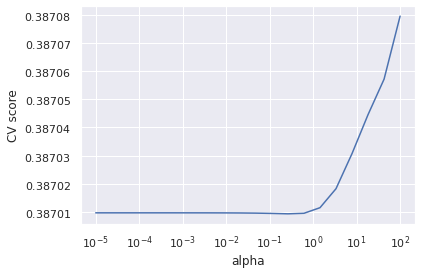

In [129]:
plt.plot(alphas_ridge, -ridge_cv.cv_results_["mean_test_score"])
plt.xscale("log")
plt.yscale("logit")
plt.xlabel("alpha")
plt.ylabel("CV score")

In [130]:
-ridge_cv.cv_results_["mean_test_score"]

array([0.38700968, 0.38700968, 0.38700968, 0.38700968, 0.38700968,
       0.38700968, 0.38700968, 0.38700967, 0.38700966, 0.38700963,
       0.38700958, 0.38700947, 0.38700933, 0.38700952, 0.3870115 ,
       0.38701825, 0.38703072, 0.38704456, 0.38705714, 0.38707953])

In [131]:
pipeline_ridge = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(best_alpha_ridge, random_state=42))
])

model_ridge = pipeline_ridge.fit(X_train_mini, y_train_mini)
pred_test = model_ridge.predict(X_test)
pred_train = model_ridge.predict(X_train_mini)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train_mini, squared=False)

print(f'RMSE на train: {rmse_train}, \nRMSE на test: {rmse_test}')


RMSE на train: 0.3872785365469962, 
RMSE на test: 0.47390243542939475


Результат почти не изменился

In [132]:
alphas_lasso = np.logspace(-5, 0, 10)
alphas_lasso

array([1.00000000e-05, 3.59381366e-05, 1.29154967e-04, 4.64158883e-04,
       1.66810054e-03, 5.99484250e-03, 2.15443469e-02, 7.74263683e-02,
       2.78255940e-01, 1.00000000e+00])

In [133]:
lasso_cv = GridSearchCV(Lasso(random_state=42), 
        [{"alpha": alphas_lasso}], 
        scoring="neg_root_mean_squared_error", 
        cv=5)

lasso_cv.fit(X_val_trans, y_val)

best_alpha_lasso = lasso_cv.best_params_["alpha"]

print("Лучшая alpha = %.4f" % best_alpha_lasso)
best_alpha_lasso

Лучшая alpha = 0.0000


1e-05

Text(0, 0.5, 'CV score')

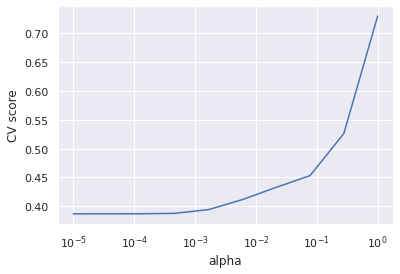

In [134]:
plt.plot(alphas_lasso, -lasso_cv.cv_results_["mean_test_score"])
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("CV score")

In [135]:
pipeline_lasso = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso(best_alpha_lasso, random_state=42))
])

model_lasso = pipeline_lasso.fit(X_train_mini, y_train_mini)
pred_test = model_lasso.predict(X_test)
pred_train = model_lasso.predict(X_train_mini)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train_mini, squared=False)

print(f'RMSE на train: {rmse_train}, \nRMSE на test: {rmse_test}')


RMSE на train: 0.38726162400264585, 
RMSE на test: 0.4738331118664044


In [136]:
alphas_lasso

array([1.00000000e-05, 3.59381366e-05, 1.29154967e-04, 4.64158883e-04,
       1.66810054e-03, 5.99484250e-03, 2.15443469e-02, 7.74263683e-02,
       2.78255940e-01, 1.00000000e+00])

In [137]:
lasso_zeros = np.sum(pipeline_lasso.steps[-1][-1].coef_ == 0)
print("Zero weights in Lasso:", lasso_zeros)

Zero weights in Lasso: 8


In [138]:
lasso_zeros_list = [0 for i in range(10)]
score = [0 for i in range(10)]

for i, alpha in enumerate(alphas_lasso):
    print(f'Итерация {i}')
    pipeline_lasso = Pipeline(steps=[
        ('ohe_and_scaling', column_transformer),
        ('regression', Lasso(alpha, random_state=13))
    ])

    model_lasso = pipeline_lasso.fit(X_train_mini, y_train_mini)
    pred_test = model_lasso.predict(X_test)
    pred_train = model_lasso.predict(X_train_mini)

    rmse_test = mean_squared_error(pred_test, y_test, squared=False)
    rmse_train = mean_squared_error(pred_train, y_train_mini, squared=False)

    res = (rmse_train, rmse_test)
    score[i] = res

    lasso_zeros = np.sum(pipeline_lasso.steps[-1][-1].coef_ == 0)
    lasso_zeros_list[i] = lasso_zeros


Итерация 0
Итерация 1
Итерация 2
Итерация 3
Итерация 4
Итерация 5
Итерация 6
Итерация 7
Итерация 8
Итерация 9


In [139]:
score_test = [x[1] for x in score]

# Количество зануленных весов
print(lasso_zeros_list)


[8, 13, 13, 19, 44, 73, 87, 91, 91, 92]


In [140]:
score_test

[0.4738331118664044,
 0.47389981525059016,
 0.47393242576447114,
 0.4744996317209493,
 0.47989518525442304,
 0.4948576763409331,
 0.5138087515134596,
 0.5321351285017804,
 0.6005741271773829,
 0.7949368944110117]

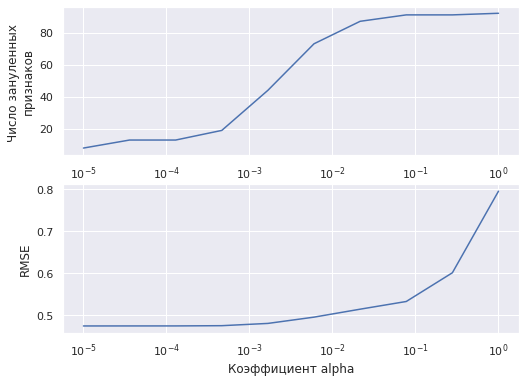

In [141]:
plt.figure(figsize = (18, 6))

plt.subplot(2, 2, 1)
plt.plot(alphas_lasso, lasso_zeros_list)
plt.xlabel("")
plt.xscale("log")
plt.ylabel("Число зануленных \nпризнаков")


plt.subplot(2, 2, 3)
plt.plot(alphas_lasso, score_test)
plt.xscale("log")
plt.xlabel("Коэффициент alpha")
plt.ylabel("RMSE")

plt.show()


<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

In [142]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
GridTrans.show_map(df=X_train, with_points=True, point_feature='is_manh_pickup', pickup_or_dropoff='pickup')

Размер выборки для визуализации: 925359                 
На карте: 1000 или меньше


In [143]:
X_train.groupby(['box_manh_pickup', 'box_manh_dropoff']).count()['id'].sort_values(ascending=False).head()

box_manh_pickup  box_manh_dropoff
 8                8                  83079
-1               -1                  36852
 7                8                  33409
 12               12                 32300
 8                7                  31592
Name: id, dtype: int64

Возникает пара вопросов:
- стоит учитывать пары для поездок, не относящихся к Манхэттену?
- стоит ли учитывать пары, в которых зоны отправления и назначения совпадают

Решение:
- использовать только пары, относящиеся к манхэттену(начались и закончились там), т.к. их большинство + добавляя поездки начавшиеся в Манхэттене и закончившиеся "где-то" и наоборот бесполезны, тк "где-то" может быть аэропортом, а также соседним районом
- учитывать пары, начавшиеся и заканчивающиеся в одном районе, тк это может многое говорить об этом районе(поездки там могут быть похожи между собой)

In [144]:
X_train.loc[(X_train['is_manh_pickup'] == 1) & (X_train['is_manh_dropoff'] == 1)].groupby(['box_manh_pickup', \
                                                'box_manh_dropoff']).count()['id'].sort_values(ascending=False).head()

box_manh_pickup  box_manh_dropoff
8                8                   83079
7                8                   33409
12               12                  32300
8                7                   31592
7                7                   27892
Name: id, dtype: int64

In [145]:
top_popular_pairs_idx = X_train.loc[(X_train['is_manh_pickup'] == 1) & (X_train['is_manh_dropoff'] == 1)].groupby(['box_manh_pickup', \
                                   'box_manh_dropoff']).count()['id'].sort_values(ascending=False).index

In [146]:
top100_popular_pairs_idx = top_popular_pairs_idx[:100]

X_train['pair_manh_number'] = -1
X_test['pair_manh_number'] = -1

for i in range(100):
    X_train.loc[(X_train['box_manh_pickup'] == top100_popular_pairs_idx[i][0]) & (X_train['box_manh_dropoff'] == top100_popular_pairs_idx[i][1]), \
        'pair_manh_number'] = i+1

for i in range(100):
    X_test.loc[(X_test['box_manh_pickup'] == top100_popular_pairs_idx[i][0]) & (X_test['box_manh_dropoff'] == top100_popular_pairs_idx[i][1]), \
        'pair_manh_number'] = i+1



In [147]:
GridTrans.show_map(df=X_train, with_points=True, point_feature='pair_manh_number', box_number=2, pickup_or_dropoff='pickup')

Размер выборки для визуализации: 33409                 
На карте: 1000 или меньше


In [148]:
GridTrans.show_map(df=X_train, with_points=True, point_feature='pair_manh_number', box_number=2, pickup_or_dropoff='dropoff')

Размер выборки для визуализации: 33409                 
На карте: 1000 или меньше


In [149]:
cat_cols.append('pair_manh_number')

In [150]:
X_test.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,...,bad_traffic,is_pickup_jfk,is_dropoff_jfk,is_pickup_lg,is_dropoff_lg,is_manh_pickup,is_manh_dropoff,box_manh_pickup,box_manh_dropoff,pair_manh_number
837588,id2606512,1,2016-05-20 13:37:37,4,-73.866379,40.771557,-73.981934,40.744854,0,1416,...,0,0,0,1,0,0,1,-1,8,-1
813419,id2004334,0,2016-03-14 21:17:20,1,-73.974365,40.753544,-73.924179,40.743637,0,875,...,0,0,0,0,0,1,0,8,-1,-1
754208,id1850769,1,2016-02-08 13:04:40,2,-74.007210,40.728928,-73.976074,40.754719,0,1145,...,0,0,0,0,0,1,1,4,8,10
1403430,id1799237,0,2016-02-07 22:45:17,1,-73.956825,40.714619,-73.989532,40.762150,0,1601,...,0,0,0,0,0,1,1,99,7,94
822535,id2221947,1,2016-02-29 13:35:52,1,-73.972908,40.743279,-73.974152,40.748169,0,243,...,0,0,0,0,0,1,1,8,8,1


In [151]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(), cat_cols),
    ('scaling', StandardScaler(), num_cols)
])

pipeline_ridge = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(0.6158, random_state=42))
])

model = pipeline_ridge.fit(X_train, y_train)
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)

rmse_test = mean_squared_error(pred_test, y_test, squared=False)
rmse_train = mean_squared_error(pred_train, y_train, squared=False)


print(f'RMSE на train: {rmse_train}\n RMSE на test: {rmse_test}')


RMSE на train: 0.37657706815147063
 RMSE на test: 0.46458985612951686


Результаты улучшились(прошлые рез-ы на test: 0.4739)

Создадим новые признаки:
- индикатор поездки из аэропорта в аэропорт, т.к. такие поездки занимают много времени
- индикатор поездки из не манхэттена в не манхэттен. вероятнее всего эта поездка будет пролегать через манхэттен и занимать много времени

In [156]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
X_train['from_air_to_air'] = 0
X_test['from_air_to_air'] = 0

X_train.loc[((X_train['is_pickup_jfk'] == 1) & (X_train['is_dropoff_lg'] == 1)) | \
            ((X_train['is_pickup_lg'] == 1) & (X_train['is_dropoff_jfk'] == 1)), 'from_air_to_air'] += 1

X_test.loc[((X_test['is_pickup_jfk'] == 1) & (X_test['is_dropoff_lg'] == 1)) | \
            ((X_test['is_pickup_lg'] == 1) & (X_test['is_dropoff_jfk'] == 1)), 'from_air_to_air'] += 1

In [157]:
air_subdf = X_train.loc[X_train['from_air_to_air'] == 1]

show_circles_on_map(air_subdf, 'dropoff_latitude', 'dropoff_longitude', 'blue')

In [158]:
cat_cols.append('from_air_to_air')

Поездки из не Манхэттена в Манхэттен:

In [159]:
X_train['not_manh'] = 0
X_test['not_manh'] = 0

X_train.loc[(X_train['is_manh_pickup'] == 0) & (X_train['is_manh_dropoff'] == 0), 'not_manh'] += 1
X_test.loc[(X_test['is_manh_pickup'] == 0) & (X_test['is_manh_dropoff'] == 0), 'not_manh'] += 1

In [161]:
# место отправления такси
not_manh_df = X_train.loc[X_train['not_manh'] == 1]

show_circles_on_map(not_manh_df.sample(2000), 'pickup_latitude', 'pickup_longitude', 'blue')

In [162]:
# такси прибывают сюда
show_circles_on_map(not_manh_df.sample(2000), 'dropoff_latitude', 'dropoff_longitude', 'blue')

In [163]:
cat_cols.append('not_manh')

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [164]:
model = pipeline_ridge.fit(X_train, y_train)
pred_train = pipeline_ridge.predict(X_train)
pred_test = pipeline_ridge.predict(X_test)

rmse_train = mean_squared_error(pred_train, y_train, squared=False)
rmse_test = mean_squared_error(pred_test, y_test, squared=False)

print(f'RMSE train: {rmse_train}\nRMSE test: {rmse_test}')

RMSE train: 0.37636638951904594
RMSE test: 0.4644397309985595


Качество стало немного выше!

**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?

Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут). 

Манхэттенское расстояние (или также "расстояние городских кварталов", "расстояние между двумя полями шахматной доски") считает расстояние, если бы мы "ходили" только вверх/вниз и влево/вправо, т.е. как ходит ладья в шахматах. Ему было дано такое название ("манхэттенское") благодаря сходству с планировкой перпендикулярных улиц в одноименном районе Нью-Йорка (да и многих других американских городов). Оно поможет нам, т.к. сейчас мы считаем расстояние как оценку снизу: физическое расстояние от одной точки до другой с учтетом формы Земли - очевидно, машины не летают, да и вертолеты тоже не всегда летят напрямую. Поэтому, учитывая, что большая часть поездок происходит по таким "угловатым" улицам, это расстояние поможет корректнее учитывать необходимый для преодоления путь. Геометрически оно считается как сумма модулей разностей координат между точками.



In [165]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
def manh_dist(lt1, lg1, lt2, lg2):
  a = haversine_dist(lt1, lg1, lt1, lg2)
  b = haversine_dist(lt1, lg1, lt2, lg1)
  return a + b

In [166]:
X_train.loc[:, 'manh_dist'] = manh_dist(X_train['pickup_latitude'].values, X_train['pickup_longitude'].values, \
                                        X_train['dropoff_latitude'].values, X_train['dropoff_longitude'].values)

X_train['log_manh_dist'] = np.log1p(X_train['manh_dist'].values)

X_test.loc[:, 'manh_dist'] = manh_dist(X_test['pickup_latitude'].values, X_test['pickup_longitude'].values, \
                                       X_test['dropoff_latitude'].values, X_test['dropoff_longitude'].values)

X_test['log_manh_dist'] = np.log1p(X_test['manh_dist'].values)

In [169]:
corr_data = X_train[['log_manh_dist', 'log_trip_duration']]
corr_data.corr()

,log_manh_dist,log_trip_duration
log_manh_dist,1.000000,0.784713
log_trip_duration,0.784713,1.000000


Text(0.5, 1.0, 'Корреляция таргета и логарифма манх. расстояния')

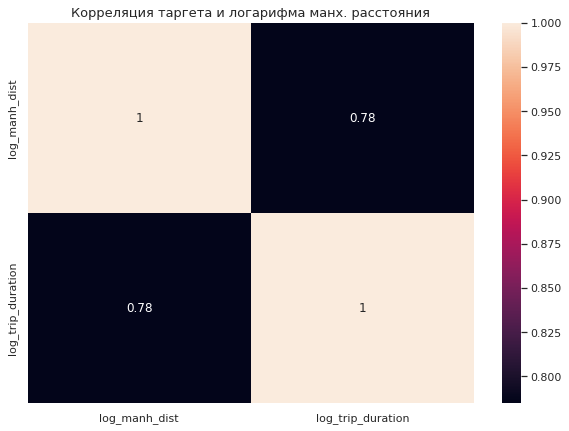

In [171]:
fig, ax = plt.subplots(figsize=(10,7))
ax = sns.heatmap(data=corr_data.corr(), ax=ax, annot=True)
ax.set_title('Корреляция таргета и логарифма манх. расстояния', fontsize=13)

Text(0.5, 1.0, 'Корреляция таргета и log_haversine')

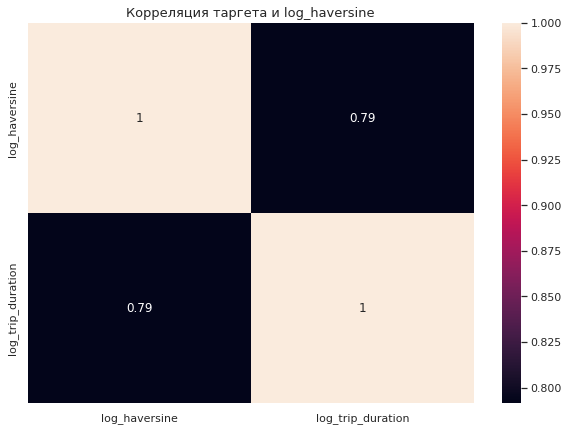

In [173]:
corr_data = X_train[['log_haversine', 'log_trip_duration']]

fig, ax = plt.subplots(figsize=(10, 7))
ax = sns.heatmap(data=corr_data.corr(), ax=ax, annot=True)
ax.set_title('Корреляция таргета и log_haversine', fontsize=13)

In [176]:
corr_data.corr()

,log_haversine,log_trip_duration
log_haversine,1.000000,0.791331
log_trip_duration,0.791331,1.000000


Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

In [179]:
num_cols.remove('log_haversine')
num_cols.append('log_manh_dist')
num_cols

['day_of_year', 'log_manh_dist']

In [180]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(), cat_cols),
    ('scaling', StandardScaler(), num_cols)
])

pipeline_ridge = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(0.6158, random_state=13))
])

model = pipeline_ridge.fit(X_train, y_train)
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)

rmse_train = mean_squared_error(pred_train, y_train, squared=False)
rmse_test = mean_squared_error(pred_test, y_test, squared=False)
print(f'RMSE на train: {rmse_train}\nRMSE на test: {rmse_test}')

RMSE на train: 0.38823467823937924
RMSE на test: 0.4739855967463513


Сделаем вывод, корреляция между не манхэттенским расстоянием чуть выше и это отразилось на качестве модели, оно также выше(0.464 против 0.474 на test)

**Задание 17 (бонус, 2 балла)**. Реализуйте трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения.


Признаки могут быть самые разные: расстояние между точкой старта и финиша, посчитанное в количестве шестиугольников; статистика по числу поездок и по их продолжительности в соседних шестиугольниках.

Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.

При построении признаков старайтесь не допустить утечки целевой переменной (подробнее про это можно почитать в материалах 1-го семинара) — в противном случае хорошего качества на тестовой выборке достичь не получится.

Измерьте качество после добавления новых признаков. За улучшение функционала ошибки на каждые 0.005 на тестовой выборке будет даваться 0.5 бонусных балла. Можно получить до 2 бонусных баллов за это задание.

In [155]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Вставьте картинку, описывающую ваш опыт выполнения этого ДЗ.